# Raciocínio Baseado em Casos e Sistemas de Recomendação
### Equipe de apoio: Davi Pereira dos Santos; Contato: [github](https://github.com/davips) 
### Professor: André de Carvalho

Tópicos
   * Criação de Grafo de Conhecimento
   * Uso de Fatoração de Matrizes  (alto nível)
   * Implementação trivial de Fatoração de Matrizes (baixo nível)
   * Exemplo completo de Fatoração de Matrizes de uso para consulta posterior em profundidade

In [59]:
# Executar no console linux:
# python3.8 -m venv .venv
# source .venv/bin/activate
# pip install networkx spacy scipy jupyter pandas pymc3 theano scipy watermark seaborn sklearn sympy
# python -m spacy download en_core_web_sm
# jupyter notebook

# Grafo de Conhecimento
Prática sobre extração do grafo de conhecimento de filmes na Wikipédia.

Dados:
https://drive.google.com/file/d/1yuEUhkVFIYfMVfpA_crFGfSeJLgbPUxu/view?usp=sharing

Baseado em:
https://www.analyticsvidhya.com/blog/2019/10/how-to-build-knowledge-graph-text-using-spacy

Modelo para o inglês:
https://spacy.io/models/en

In [79]:
import pandas as pd
import requests
from pprint import pprint
import spacy
from spacy import displacy
from spacy.matcher import Matcher
from spacy.tokens import Span
import networkx as nx
import matplotlib.pyplot as plt
from tqdm import tqdm
import matplotlib
from random import randint, seed
import numpy as np
from numpy import tile
from numpy.core import mean
from numpy.ma import masked_equal
from numpy.random.mtrand import normal
import numpy as np
import pandas as pd
import pymc3 as pm
import logging
import time
import scipy as sp
import theano
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

from matplotlib import pyplot as plt

plt.style.use("seaborn-darkgrid")
nlp = spacy.load('en_core_web_sm')

pd.set_option('display.max_colwidth', 200)
%matplotlib inline

# Função auxiliar para cuidar da parte de linguagem natural.
# https://gist.githubusercontent.com/prateekjoshi565/6833da973d65338216d0f6b99755d120/raw/209c8734023763493514f58d49d77c7b09c57e69/kg_get_entities.py
def get_entities(sent):
  ## chunk 1
  ent1 = ""
  ent2 = ""
  prv_tok_dep = ""    # dependency tag of previous token in the sentence
  prv_tok_text = ""   # previous token in the sentence
  prefix = ""
  modifier = ""
  for tok in nlp(sent):
    ## chunk 2
    # if token is a punctuation mark then move on to the next token
    if tok.dep_ != "punct":
      # check: token is a compound word or not
      if tok.dep_ == "compound":
        prefix = tok.text
        # if the previous word was also a 'compound' then add the current word to it
        if prv_tok_dep == "compound":
          prefix = prv_tok_text + " "+ tok.text
      
      # check: token is a modifier or not
      if tok.dep_.endswith("mod") == True:
        modifier = tok.text
        # if the previous word was also a 'compound' then add the current word to it
        if prv_tok_dep == "compound":
          modifier = prv_tok_text + " "+ tok.text
      
      ## chunk 3
      if tok.dep_.find("subj") == True:
        ent1 = modifier +" "+ prefix + " "+ tok.text
        prefix = ""
        modifier = ""
        prv_tok_dep = ""
        prv_tok_text = ""      

      ## chunk 4
      if tok.dep_.find("obj") == True:
        ent2 = modifier +" "+ prefix +" "+ tok.text
        
      ## chunk 5  
      # update variables
      prv_tok_dep = tok.dep_
      prv_tok_text = tok.text
  #############################################################

  return [ent1.strip(), ent2.strip()]
def get_relation(sent):

  doc = nlp(sent)

  # Matcher class object 
  matcher = Matcher(nlp.vocab)

  #define the pattern 
  pattern = [{'DEP':'ROOT'}, 
            {'DEP':'prep','OP':"?"},
            {'DEP':'agent','OP':"?"},  
            {'POS':'ADJ','OP':"?"}] 

  matcher.add("matching_1", [pattern]) 

  matches = matcher(doc)
  k = len(matches) - 1

  span = doc[matches[k][1]:matches[k][2]] 

  return(span.text)

In [3]:
nlp = spacy.load('en_core_web_sm')

doc = nlp("I have been studying data science in University of São Paulo.")

for token in doc:
  print(f"{token.text:16}: {token.dep_}")

I               : nsubj
have            : aux
been            : aux
studying        : ROOT
data            : compound
science         : dobj
in              : prep
University      : pobj
of              : prep
São             : pobj
Paulo           : pobj
.               : punct


"University of São Paulo" é uma única entidade, assim como "data science".


In [4]:
candidate_sentences = pd.read_csv("wiki_sentences_v2.csv")
candidate_sentences.head()

,sentence
0,"confused and frustrated, connie decides to leave on her own."
1,"later, a woman’s scream is heard in the distance."
2,christian is then paralyzed by an elder.
3,the temple is set on fire.
4,"outside, the cult wails with him."


In [5]:
# Amostragem aleatória.
candidate_sentences['sentence'].sample(5)

2205                                                                                   and then i think there's a link between storytelling and death.
1047    audio drama, whether newly produced or otr classics, can be found on cds, cassette tapes, podcasts, webcasts and conventional broadcast radio.
7                                                                    later, craig di francia and action bronson were revealed to have joined the cast.
792                                                                                                             it was photographed with arri alexa xt
1714                   pressured by rushed production schedules and small budgets, some bollywood writers and musicians have been known to plagiarise.
Name: sentence, dtype: object

In [6]:
entity_pairs = []
for i in tqdm(candidate_sentences["sentence"]):
  entity_pairs.append(get_entities(i))

entity_pairs[10:20]

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 4318/4318 [00:18<00:00, 238.87it/s]


[['we', 'tests'],
 ['m', 'international sales rights'],
 ['canadian musician robbie robertson', 'soundtrack'],
 ['it', 'original music tracks'],
 ['it', 'reviewed  franchise'],
 ['she', 'accidentally  mystique'],
 ['military  forces', 'arrest'],
 ['train', 'vuk'],
 ['kota eberhardt', 'telepath selene gallio'],
 ['singer', 'sequel']]

In [7]:
get_relation("I have been studying data science in University of São Paulo.")

'studying'

In [8]:
relations = [get_relation(i) for i in tqdm(candidate_sentences['sentence'])]
relations[:5]

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 4318/4318 [00:18<00:00, 236.02it/s]


['decides', 'heard in', 'paralyzed by', 'set on', 'wails with']

In [9]:
pd.Series(relations).value_counts()[:40]

is               360
was              296
released on       89
include           70
were              68
are               68
                  50
released          41
's                36
became            32
composed by       32
have              31
has               30
released in       27
become            26
included          23
called            23
considered        22
been              20
had               20
used              18
be                18
made              18
produced          18
directed by       16
scheduled         15
hired             14
produced by       13
went              13
written by        13
introduced in     13
received          13
set               13
wrote             13
won               11
wanted            11
began             11
stars             11
cast as           11
began in          11
dtype: int64

### Grafo de Conhecimento

In [10]:
sujeito = [i[0] for i in entity_pairs]
objeto = [i[1] for i in entity_pairs]

kg_df = pd.DataFrame({'sujeito':sujeito, 'objeto':objeto, 'ação':relations})
kg_df.head()

,sujeito,objeto,ação
0,connie,own,decides
1,later scream,distance,heard in
2,christian,then elder,paralyzed by
3,temple,fire,set on
4,,outside cult him,wails with


In [11]:
G = nx.from_pandas_edgelist(kg_df, "sujeito", "objeto", edge_attr=True, create_using=nx.MultiDiGraph())

In [12]:
# plt.figure(figsize=(12,12))

# pos = nx.spring_layout(G)
# nx.draw(G, with_labels=True, node_color='skyblue', edge_cmap=plt.cm.Blues, pos = pos)
# plt.show()

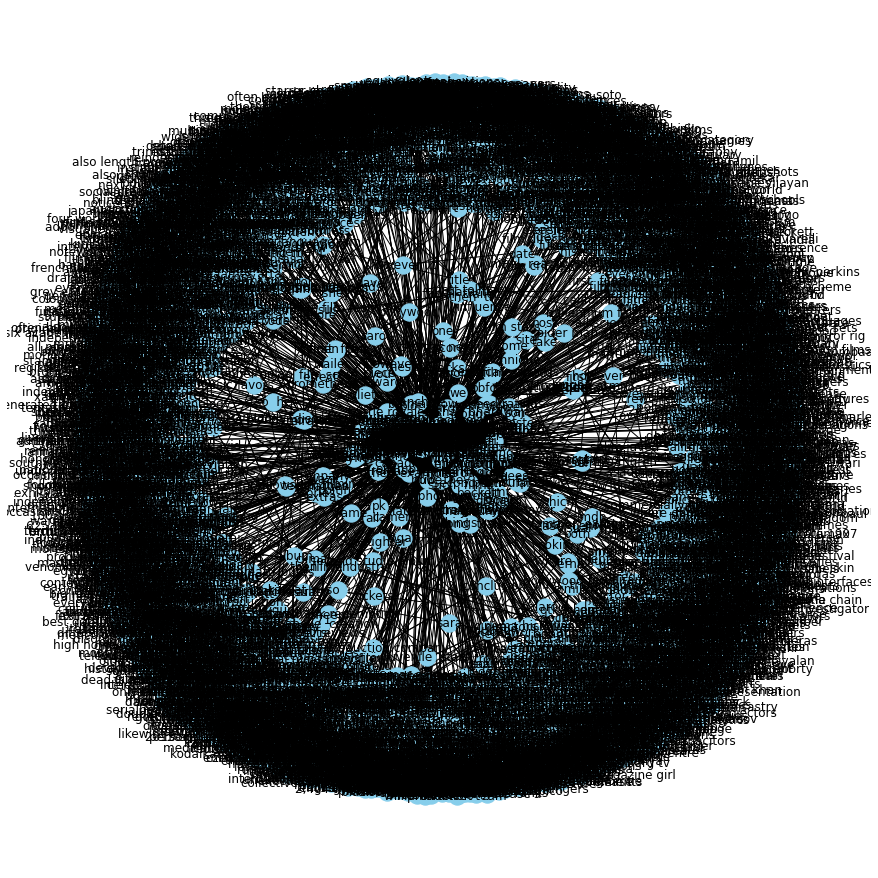

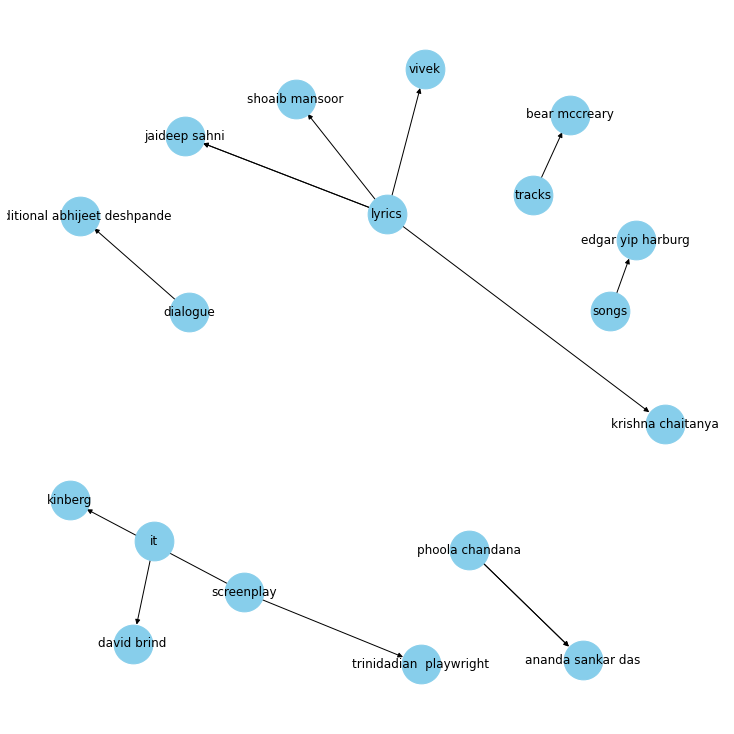

In [13]:
ação = "written by"
G=nx.from_pandas_edgelist(kg_df[kg_df['ação']==ação], "sujeito", "objeto", edge_attr=True, create_using=nx.MultiDiGraph())

plt.figure(figsize=(10,10))
pos = nx.spring_layout(G, k = 0.5) # k regulates the distance between nodes
nx.draw(G, with_labels=True, node_color='skyblue', node_size=1500, edge_cmap=plt.cm.Blues, pos = pos)
plt.show()

# Fatoração de Matrizes Latentes em Sistemas de Recomendação
Baseado em: https://docs.pymc.io/notebooks/probabilistic_matrix_factorization.html

Conjunto de dados: https://files.grouplens.org/datasets/movielens/ml-100k.zip

Não é razoável esperar que cada usuário avalie todos os itens.
Por isso a matriz é esparsa.

Algumas definições retiradas daqui:
https://towardsdatascience.com/probabilistic-matrix-factorization-b7852244a321
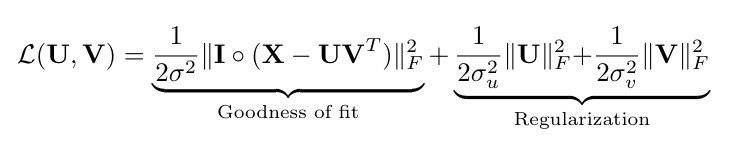
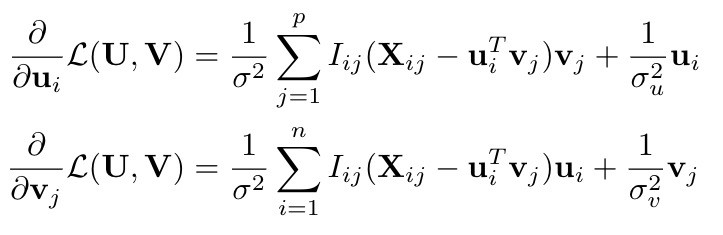
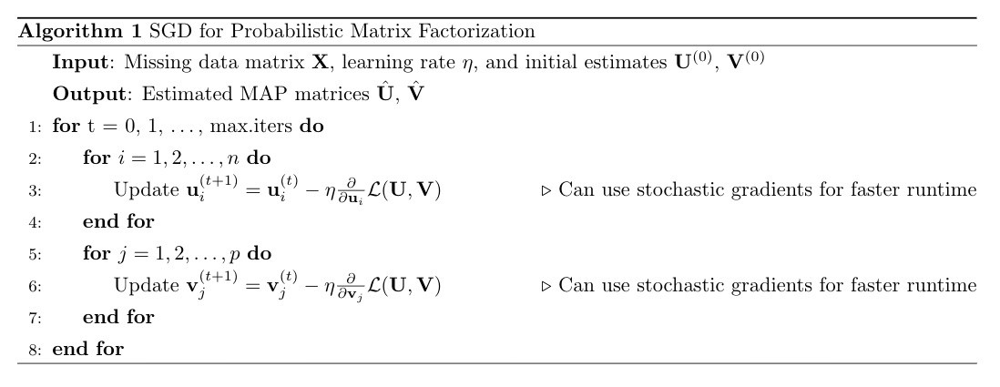

## Alto Nível - Exemplo de Uso
Vamos usar uma base de livros de um notebook em Sistemas de Recomendação

https://www.kaggle.com/davips/probalistic-matrix-factorization/edit

## Baixo Nível - Manipulação de Matrizes
Vamos fazer nossa própria fatoração de matrizes de *baixo orçamento*.
Momento ideal para enfrentarmos os segredos do python, numpy, sympy etc.

In [55]:
with open("u.data") as f:
    t = f.read()
print(t)


196	242	3	881250949
186	302	3	891717742
22	377	1	878887116
244	51	2	880606923
166	346	1	886397596
298	474	4	884182806
115	265	2	881171488
253	465	5	891628467
305	451	3	886324817
6	86	3	883603013
62	257	2	879372434
286	1014	5	879781125
200	222	5	876042340
210	40	3	891035994
224	29	3	888104457
303	785	3	879485318
122	387	5	879270459
194	274	2	879539794
291	1042	4	874834944
234	1184	2	892079237
119	392	4	886176814
167	486	4	892738452
299	144	4	877881320
291	118	2	874833878
308	1	4	887736532
95	546	2	879196566
38	95	5	892430094
102	768	2	883748450
63	277	4	875747401
160	234	5	876861185
50	246	3	877052329
301	98	4	882075827
225	193	4	879539727
290	88	4	880731963
97	194	3	884238860
157	274	4	886890835
181	1081	1	878962623
278	603	5	891295330
276	796	1	874791932
7	32	4	891350932
10	16	4	877888877
284	304	4	885329322
201	979	2	884114233
276	564	3	874791805
287	327	5	875333916
246	201	5	884921594
242	1137	5	879741196
249	241	5	879641194
99	4	5	886519097
178	332	3	882823437
251	100	4	886271884
8

In [58]:
linhas = t.split("\n")
pprint(linhas)


['196\t242\t3\t881250949',
 '186\t302\t3\t891717742',
 '22\t377\t1\t878887116',
 '244\t51\t2\t880606923',
 '166\t346\t1\t886397596',
 '298\t474\t4\t884182806',
 '115\t265\t2\t881171488',
 '253\t465\t5\t891628467',
 '305\t451\t3\t886324817',
 '6\t86\t3\t883603013',
 '62\t257\t2\t879372434',
 '286\t1014\t5\t879781125',
 '200\t222\t5\t876042340',
 '210\t40\t3\t891035994',
 '224\t29\t3\t888104457',
 '303\t785\t3\t879485318',
 '122\t387\t5\t879270459',
 '194\t274\t2\t879539794',
 '291\t1042\t4\t874834944',
 '234\t1184\t2\t892079237',
 '119\t392\t4\t886176814',
 '167\t486\t4\t892738452',
 '299\t144\t4\t877881320',
 '291\t118\t2\t874833878',
 '308\t1\t4\t887736532',
 '95\t546\t2\t879196566',
 '38\t95\t5\t892430094',
 '102\t768\t2\t883748450',
 '63\t277\t4\t875747401',
 '160\t234\t5\t876861185',
 '50\t246\t3\t877052329',
 '301\t98\t4\t882075827',
 '225\t193\t4\t879539727',
 '290\t88\t4\t880731963',
 '97\t194\t3\t884238860',
 '157\t274\t4\t886890835',
 '181\t1081\t1\t878962623',
 '278\t603\t5\t

 '244\t157\t4\t880604119',
 '234\t491\t4\t892079538',
 '275\t588\t3\t875154535',
 '186\t53\t1\t879023882',
 '99\t1052\t1\t885679533',
 '269\t131\t5\t891449728',
 '311\t720\t3\t884366307',
 '270\t1119\t5\t876955729',
 '286\t1035\t3\t877532094',
 '311\t94\t3\t884366187',
 '211\t257\t5\t879461498',
 '239\t671\t5\t889179290',
 '201\t98\t4\t884111312',
 '43\t403\t4\t883956305',
 '315\t216\t4\t879821120',
 '53\t924\t3\t879443303',
 '308\t452\t2\t887741329',
 '338\t613\t3\t879438597',
 '90\t357\t5\t891385132',
 '303\t327\t1\t879466166',
 '247\t271\t2\t893081411',
 '144\t303\t4\t888103407',
 '102\t1030\t1\t892994075',
 '90\t739\t5\t891384789',
 '72\t527\t4\t880036746',
 '286\t248\t5\t875806800',
 '201\t32\t3\t884140049',
 '327\t497\t4\t887818658',
 '141\t125\t5\t884585642',
 '167\t675\t1\t892738277',
 '262\t217\t3\t879792818',
 '151\t813\t4\t879524222',
 '13\t859\t1\t882397040',
 '276\t207\t4\t874795988',
 '246\t1073\t4\t884921380',
 '298\t98\t4\t884127720',
 '23\t88\t3\t874787410',
 '94\t700\

 '291\t174\t5\t874835062',
 '281\t538\t4\t881200520',
 '79\t301\t3\t891271308',
 '244\t191\t5\t880605766',
 '248\t210\t3\t884534946',
 '342\t175\t5\t874984207',
 '236\t111\t4\t890116939',
 '297\t1296\t4\t875408935',
 '159\t678\t5\t880485530',
 '255\t565\t1\t883216748',
 '286\t309\t5\t884583549',
 '318\t88\t4\t884496367',
 '77\t174\t5\t884733587',
 '109\t252\t5\t880571629',
 '244\t1045\t5\t880602132',
 '264\t4\t4\t886123656',
 '128\t190\t4\t879967016',
 '158\t163\t4\t880135044',
 '83\t609\t4\t880308453',
 '23\t380\t5\t874787774',
 '214\t313\t4\t892668197',
 '110\t783\t3\t886988967',
 '308\t219\t3\t887738717',
 '159\t286\t1\t880485233',
 '113\t327\t5\t875076987',
 '178\t83\t4\t882826556',
 '254\t214\t1\t886472608',
 '30\t1007\t5\t885941156',
 '109\t322\t2\t880562908',
 '73\t923\t3\t888793388',
 '291\t567\t5\t874867786',
 '60\t480\t4\t883326273',
 '296\t238\t4\t884199624',
 '356\t689\t5\t891406372',
 '362\t258\t4\t885019435',
 '16\t69\t5\t877724846',
 '318\t501\t4\t884496984',
 '227\t286\

 '216\t153\t4\t880244802',
 '379\t294\t3\t880524363',
 '391\t197\t5\t877399380',
 '405\t540\t1\t885548163',
 '339\t286\t5\t891032349',
 '56\t849\t2\t892910913',
 '372\t561\t5\t876869534',
 '387\t651\t2\t886479689',
 '399\t175\t3\t882342669',
 '49\t1082\t3\t888066214',
 '367\t56\t5\t876689932',
 '346\t291\t5\t875002643',
 '119\t829\t5\t874775406',
 '251\t418\t4\t886271856',
 '90\t501\t5\t891384885',
 '347\t462\t2\t881654359',
 '10\t475\t4\t877888545',
 '1\t241\t4\t878543133',
 '343\t708\t4\t876407006',
 '145\t230\t5\t885557660',
 '294\t125\t3\t877820272',
 '337\t235\t3\t875184717',
 '216\t1010\t3\t880232685',
 '7\t564\t3\t891354471',
 '378\t10\t3\t880044454',
 '99\t827\t3\t885679504',
 '13\t652\t5\t882141458',
 '308\t486\t4\t887737432',
 '303\t1048\t4\t879484871',
 '222\t849\t4\t881060281',
 '295\t86\t5\t879966498',
 '195\t921\t3\t883934716',
 '130\t597\t4\t874953866',
 '389\t942\t3\t880165881',
 '137\t51\t1\t881433605',
 '345\t26\t3\t884993555',
 '222\t276\t5\t877563550',
 '94\t616\t4\

 '344\t255\t4\t889814555',
 '17\t744\t3\t885272606',
 '311\t265\t5\t884364812',
 '160\t603\t4\t876861754',
 '175\t132\t3\t877107712',
 '413\t7\t3\t879969614',
 '43\t56\t5\t875975687',
 '396\t986\t4\t884646537',
 '120\t148\t3\t889490499',
 '379\t4\t5\t880525598',
 '190\t895\t3\t891033327',
 '99\t978\t3\t885679382',
 '429\t467\t4\t882385210',
 '193\t352\t1\t889123777',
 '269\t498\t4\t891448926',
 '435\t188\t4\t884131901',
 '174\t122\t1\t886434421',
 '13\t109\t4\t882141306',
 '13\t431\t1\t882397271',
 '116\t730\t4\t876453519',
 '445\t12\t2\t890987617',
 '314\t781\t3\t877891937',
 '318\t697\t5\t884496008',
 '58\t13\t3\t884304503',
 '354\t136\t5\t891217717',
 '158\t235\t1\t880132794',
 '87\t628\t4\t879877709',
 '294\t749\t3\t877818915',
 '26\t742\t3\t891352492',
 '378\t12\t5\t880046132',
 '334\t135\t4\t891545793',
 '279\t40\t4\t875306910',
 '366\t184\t4\t888857866',
 '406\t1267\t3\t882480710',
 '255\t441\t2\t883216544',
 '450\t265\t5\t882371526',
 '232\t919\t3\t888550036',
 '246\t176\t4\t88

 '496\t142\t2\t876067686',
 '344\t955\t4\t889814195',
 '468\t51\t3\t875293386',
 '394\t554\t4\t881058101',
 '455\t196\t4\t879111737',
 '250\t288\t4\t878088970',
 '393\t87\t4\t889554706',
 '398\t95\t5\t875659266',
 '76\t42\t3\t882606243',
 '440\t283\t5\t891577894',
 '374\t148\t4\t880392992',
 '380\t71\t4\t885479082',
 '218\t203\t4\t881288620',
 '25\t479\t5\t885852569',
 '332\t982\t3\t887938601',
 '13\t83\t2\t886303585',
 '176\t151\t4\t886048305',
 '194\t503\t4\t879522916',
 '467\t264\t2\t879532296',
 '455\t161\t4\t879112098',
 '406\t476\t4\t879540147',
 '494\t64\t5\t879541207',
 '286\t883\t5\t884069544',
 '100\t328\t4\t891375212',
 '13\t313\t4\t882774047',
 '64\t265\t4\t879365491',
 '330\t91\t4\t876547426',
 '326\t491\t4\t879876235',
 '279\t421\t3\t892864867',
 '335\t902\t5\t891566808',
 '158\t275\t5\t880132313',
 '452\t173\t4\t875261350',
 '193\t38\t3\t889126055',
 '151\t528\t5\t879524849',
 '201\t1422\t2\t884114194',
 '387\t319\t1\t886484384',
 '360\t45\t4\t880355747',
 '374\t845\t2\t

 '455\t31\t4\t879111937',
 '384\t313\t5\t891273683',
 '201\t631\t2\t884140750',
 '454\t272\t5\t888007255',
 '389\t384\t2\t880089211',
 '487\t69\t4\t883445859',
 '456\t168\t4\t881373794',
 '393\t465\t4\t887746916',
 '123\t657\t4\t879872066',
 '416\t879\t3\t892439224',
 '339\t197\t5\t891033653',
 '297\t258\t5\t874953892',
 '457\t157\t5\t882553112',
 '262\t1013\t2\t879791471',
 '293\t1229\t1\t888907210',
 '130\t929\t4\t876251160',
 '340\t520\t5\t884991544',
 '451\t1025\t3\t879012773',
 '339\t227\t2\t891035524',
 '474\t696\t3\t887916330',
 '489\t343\t5\t891447913',
 '134\t328\t4\t891732335',
 '533\t275\t4\t887721848',
 '526\t7\t4\t885682400',
 '75\t427\t4\t884051921',
 '308\t523\t4\t887737084',
 '324\t749\t3\t880575277',
 '394\t541\t3\t880889741',
 '429\t1017\t3\t882385399',
 '267\t810\t3\t878973568',
 '340\t173\t5\t884990703',
 '75\t304\t2\t884051610',
 '116\t888\t2\t886309958',
 '262\t582\t4\t879962517',
 '89\t724\t4\t879460027',
 '387\t176\t3\t886480446',
 '41\t318\t4\t890687353',
 '387

 '493\t746\t4\t884131143',
 '276\t395\t2\t877935377',
 '567\t7\t4\t882426622',
 '14\t428\t4\t879119497',
 '478\t98\t5\t889388862',
 '52\t815\t4\t882922357',
 '58\t640\t5\t884304767',
 '486\t258\t5\t879874064',
 '450\t231\t3\t887662002',
 '299\t634\t2\t877880852',
 '564\t333\t3\t888718521',
 '83\t25\t2\t883867729',
 '399\t43\t3\t882348664',
 '130\t250\t3\t876250833',
 '381\t16\t4\t892697266',
 '95\t1188\t2\t880572787',
 '500\t498\t4\t883873911',
 '561\t501\t3\t885808620',
 '95\t705\t5\t880570964',
 '495\t1119\t4\t888634784',
 '457\t230\t4\t882392853',
 '334\t13\t3\t891545089',
 '253\t895\t4\t891627893',
 '342\t1170\t3\t875319659',
 '234\t25\t3\t892335797',
 '72\t228\t1\t880037204',
 '342\t326\t1\t874984002',
 '406\t72\t3\t880131954',
 '506\t1073\t4\t874873247',
 '486\t127\t5\t879874448',
 '556\t520\t5\t882136441',
 '421\t333\t4\t892241236',
 '509\t310\t1\t883590443',
 '24\t173\t5\t875323474',
 '534\t595\t4\t877807747',
 '378\t756\t3\t880057088',
 '447\t1\t3\t878854273',
 '467\t276\t5\t8

 '537\t875\t1\t886028544',
 '244\t357\t5\t880605553',
 '486\t879\t3\t879874297',
 '401\t509\t4\t891033582',
 '495\t496\t5\t888632888',
 '297\t185\t5\t875239870',
 '56\t946\t4\t892737210',
 '6\t274\t4\t883602501',
 '493\t95\t5\t884131287',
 '595\t1059\t4\t886921344',
 '151\t9\t4\t879524199',
 '177\t1218\t4\t880131231',
 '69\t265\t4\t882145400',
 '299\t283\t3\t889417370',
 '82\t834\t1\t884714618',
 '621\t748\t4\t880226710',
 '59\t1\t2\t888203053',
 '393\t29\t4\t889729398',
 '521\t144\t3\t884478171',
 '537\t653\t4\t886030738',
 '379\t271\t3\t886835602',
 '452\t924\t5\t885816916',
 '350\t479\t5\t882345789',
 '57\t105\t3\t883698009',
 '506\t175\t5\t874873327',
 '104\t255\t1\t888465604',
 '52\t285\t5\t882922227',
 '421\t448\t3\t892241687',
 '457\t8\t5\t882397734',
 '271\t521\t5\t885848373',
 '54\t328\t4\t880928957',
 '327\t631\t3\t887747133',
 '469\t483\t5\t879524177',
 '528\t238\t3\t886101782',
 '367\t563\t4\t876690077',
 '381\t931\t4\t892697628',
 '465\t87\t4\t883530054',
 '499\t657\t5\t88

 '264\t100\t5\t886122261',
 '299\t792\t4\t889503112',
 '639\t51\t2\t891239613',
 '363\t691\t3\t891493663',
 '326\t229\t3\t879876941',
 '295\t561\t5\t879518696',
 '5\t396\t5\t875636265',
 '532\t305\t3\t878372701',
 '493\t209\t5\t884130933',
 '410\t316\t4\t888627138',
 '600\t50\t4\t888451492',
 '467\t117\t2\t879532437',
 '615\t988\t1\t879447735',
 '334\t856\t4\t891545926',
 '592\t313\t5\t882955258',
 '621\t881\t2\t883798770',
 '201\t1128\t4\t884140825',
 '194\t432\t4\t879524007',
 '393\t291\t4\t887744202',
 '375\t233\t4\t886621985',
 '541\t62\t4\t883871644',
 '295\t265\t4\t879518042',
 '454\t435\t2\t881960145',
 '452\t521\t3\t885545770',
 '59\t184\t4\t888206094',
 '536\t97\t3\t882360662',
 '619\t226\t5\t885954133',
 '618\t1468\t3\t891308665',
 '603\t923\t4\t891957139',
 '561\t285\t4\t885808715',
 '72\t56\t5\t880037702',
 '457\t59\t5\t882397575',
 '660\t926\t2\t891201587',
 '96\t127\t5\t884403214',
 '176\t298\t4\t886047918',
 '342\t846\t2\t875318688',
 '653\t527\t2\t878855510',
 '118\t175

 '577\t265\t5\t880474851',
 '709\t195\t5\t879848432',
 '593\t866\t5\t875660236',
 '174\t244\t4\t886433881',
 '676\t181\t5\t892686164',
 '644\t258\t4\t889075928',
 '399\t147\t5\t882340620',
 '559\t322\t4\t891034987',
 '398\t474\t4\t875657926',
 '577\t582\t4\t880475540',
 '326\t239\t3\t879875612',
 '83\t393\t5\t887665423',
 '488\t1039\t4\t891294654',
 '697\t333\t3\t882621431',
 '339\t81\t5\t891033566',
 '526\t750\t4\t885681886',
 '626\t332\t3\t878771355',
 '242\t268\t5\t879741340',
 '682\t182\t4\t888523619',
 '552\t240\t2\t879222133',
 '334\t508\t3\t891544867',
 '279\t1321\t4\t888806671',
 '717\t287\t5\t884642558',
 '373\t1039\t4\t877098437',
 '65\t69\t3\t879216479',
 '719\t659\t4\t879373935',
 '26\t274\t3\t891385634',
 '11\t42\t3\t891905058',
 '712\t1178\t4\t874957086',
 '612\t118\t3\t875324947',
 '532\t506\t5\t889235367',
 '682\t80\t1\t888521803',
 '684\t520\t4\t875812065',
 '273\t347\t4\t891293008',
 '425\t100\t4\t878738853',
 '537\t288\t2\t886028706',
 '454\t1203\t2\t888267521',
 '66

 '669\t427\t4\t892550137',
 '717\t290\t3\t884642738',
 '119\t137\t5\t886176486',
 '222\t393\t4\t878184028',
 '416\t792\t4\t876699526',
 '601\t840\t2\t876347599',
 '1\t115\t5\t878541637',
 '773\t169\t5\t888539232',
 '627\t510\t4\t879529730',
 '236\t427\t5\t890118153',
 '108\t931\t2\t879880190',
 '606\t183\t5\t880926162',
 '724\t690\t1\t883757468',
 '554\t151\t4\t876550100',
 '577\t118\t3\t880471658',
 '627\t582\t3\t879529916',
 '189\t661\t4\t893265569',
 '13\t881\t2\t881514876',
 '624\t181\t4\t879792378',
 '64\t228\t4\t889739438',
 '129\t906\t5\t883245310',
 '749\t879\t4\t878846449',
 '655\t904\t5\t887473639',
 '758\t7\t5\t881975243',
 '734\t198\t1\t891022734',
 '551\t95\t5\t892783791',
 '762\t116\t1\t878719186',
 '42\t523\t5\t881107375',
 '286\t741\t4\t876521887',
 '436\t1058\t4\t887770547',
 '514\t48\t4\t875318114',
 '621\t584\t5\t874965094',
 '525\t762\t4\t881085917',
 '654\t169\t5\t887864275',
 '184\t396\t3\t889910326',
 '524\t484\t4\t884634646',
 '749\t144\t5\t878847835',
 '508\t13

 '551\t88\t4\t892783314',
 '806\t407\t3\t882386125',
 '671\t684\t3\t883546890',
 '568\t242\t4\t877906547',
 '709\t860\t3\t879848318',
 '659\t356\t3\t891385012',
 '367\t637\t3\t876690021',
 '664\t196\t4\t878090054',
 '671\t144\t4\t884035686',
 '622\t395\t2\t882672143',
 '768\t117\t4\t883834981',
 '655\t770\t2\t892011201',
 '567\t205\t3\t882425736',
 '676\t845\t5\t892686398',
 '555\t181\t5\t879962172',
 '715\t318\t5\t875963867',
 '474\t709\t5\t887928755',
 '489\t333\t4\t891362740',
 '566\t318\t4\t881649471',
 '417\t82\t4\t879647326',
 '805\t222\t4\t881694823',
 '630\t174\t3\t885668131',
 '622\t169\t5\t882669374',
 '354\t478\t5\t891217365',
 '332\t125\t5\t887938224',
 '796\t488\t2\t892662400',
 '303\t228\t4\t879467574',
 '751\t56\t4\t889132775',
 '517\t405\t4\t892659893',
 '748\t710\t3\t879455410',
 '385\t133\t1\t879441728',
 '682\t294\t3\t888516841',
 '416\t183\t5\t893214127',
 '766\t99\t3\t891309810',
 '788\t570\t3\t880869862',
 '576\t50\t4\t887081005',
 '757\t1090\t2\t888467187',
 '543

 '298\t820\t4\t884183897',
 '864\t408\t5\t877214085',
 '682\t384\t2\t888522073',
 '705\t284\t3\t883427190',
 '751\t748\t2\t887135437',
 '543\t94\t3\t877550791',
 '183\t94\t3\t891466863',
 '239\t647\t5\t889180651',
 '711\t143\t5\t879993236',
 '864\t53\t4\t888891794',
 '865\t1028\t1\t880144024',
 '648\t368\t2\t884366748',
 '833\t157\t2\t875132195',
 '753\t499\t3\t891402323',
 '758\t529\t4\t881979609',
 '551\t779\t4\t892785399',
 '429\t277\t4\t882386096',
 '778\t738\t1\t891578101',
 '807\t1483\t4\t892527385',
 '506\t684\t5\t874873529',
 '297\t156\t4\t875240090',
 '846\t585\t2\t883949643',
 '606\t307\t4\t888334083',
 '765\t242\t5\t880345862',
 '841\t288\t3\t889067046',
 '480\t294\t1\t891208058',
 '343\t154\t5\t876406552',
 '648\t444\t3\t884883679',
 '544\t331\t3\t884795516',
 '358\t174\t1\t891270560',
 '847\t238\t2\t878939975',
 '862\t407\t3\t879303843',
 '672\t815\t4\t879788819',
 '798\t270\t4\t880483677',
 '712\t623\t4\t874729778',
 '188\t318\t5\t875072518',
 '683\t682\t1\t893284032',
 '

 '870\t549\t2\t879270213',
 '618\t443\t4\t891308665',
 '782\t266\t1\t891498919',
 '747\t480\t5\t888639060',
 '807\t485\t5\t892531977',
 '187\t83\t5\t879465274',
 '753\t195\t1\t891401851',
 '298\t526\t5\t884182573',
 '336\t367\t3\t877757910',
 '852\t930\t3\t891037777',
 '290\t235\t3\t880474451',
 '761\t326\t1\t876189715',
 '711\t82\t3\t879994632',
 '825\t870\t3\t880931932',
 '465\t428\t3\t883531246',
 '43\t70\t4\t883955048',
 '887\t1015\t5\t881377933',
 '590\t116\t5\t879439196',
 '844\t318\t4\t877382762',
 '328\t939\t4\t885046655',
 '407\t675\t3\t876349153',
 '877\t59\t5\t882677012',
 '630\t756\t4\t885667551',
 '329\t302\t5\t891655191',
 '661\t972\t3\t876016581',
 '447\t227\t2\t878856233',
 '293\t218\t2\t888906168',
 '248\t172\t4\t884534992',
 '10\t654\t5\t877886597',
 '639\t1465\t2\t891239048',
 '883\t69\t2\t891717356',
 '881\t179\t5\t876538400',
 '731\t648\t4\t886183515',
 '889\t1589\t5\t880177219',
 '642\t944\t5\t885605987',
 '833\t427\t3\t878078390',
 '686\t97\t2\t879546847',
 '846\

 '74\t508\t4\t888333542',
 '144\t56\t4\t888105387',
 '321\t116\t3\t879439595',
 '902\t50\t5\t879464726',
 '880\t367\t4\t880174730',
 '885\t195\t4\t885715827',
 '851\t343\t2\t883148773',
 '301\t205\t4\t882076046',
 '650\t80\t2\t891389216',
 '795\t42\t3\t881252510',
 '617\t567\t2\t883789747',
 '701\t328\t4\t891446707',
 '698\t96\t4\t886366515',
 '645\t186\t4\t892053340',
 '735\t283\t2\t876698796',
 '854\t1677\t3\t882814368',
 '291\t98\t5\t874834701',
 '869\t240\t4\t884491734',
 '642\t780\t5\t885606270',
 '183\t121\t3\t891463809',
 '544\t288\t2\t884795135',
 '709\t859\t3\t879848318',
 '885\t56\t3\t885714641',
 '807\t210\t4\t892528646',
 '442\t433\t4\t883388283',
 '919\t321\t2\t875288164',
 '826\t678\t4\t885689942',
 '379\t286\t4\t880524329',
 '654\t153\t4\t887864414',
 '707\t294\t2\t879438988',
 '828\t1056\t1\t891036630',
 '588\t1219\t2\t890028385',
 '435\t687\t2\t884130834',
 '782\t1380\t2\t891500150',
 '844\t7\t3\t877381784',
 '378\t98\t5\t880045760',
 '758\t505\t5\t881979012',
 '826\t5

 '406\t444\t3\t879792928',
 '76\t264\t3\t875027292',
 '345\t248\t5\t884994083',
 '13\t393\t3\t882141617',
 '727\t941\t2\t883711874',
 '654\t70\t4\t887864663',
 '524\t4\t4\t884636498',
 '776\t145\t2\t892920381',
 '916\t721\t4\t880845049',
 '715\t64\t5\t875963242',
 '929\t1\t3\t878402162',
 '647\t73\t5\t876537697',
 '373\t233\t3\t877105588',
 '901\t679\t4\t877131205',
 '790\t246\t4\t884461283',
 '385\t357\t4\t879441339',
 '788\t963\t4\t880868644',
 '807\t313\t5\t892527050',
 '632\t527\t4\t879458429',
 '790\t49\t3\t885156852',
 '95\t1227\t2\t880572581',
 '181\t1356\t1\t878963204',
 '667\t210\t3\t891035051',
 '916\t281\t3\t880843727',
 '416\t791\t2\t886319550',
 '682\t229\t4\t888520923',
 '394\t24\t5\t880889350',
 '852\t260\t3\t891036414',
 '749\t167\t2\t878848701',
 '696\t302\t5\t886403632',
 '868\t198\t5\t877103757',
 '643\t156\t5\t891446826',
 '13\t127\t5\t881515411',
 '346\t159\t4\t874949011',
 '927\t274\t1\t879181133',
 '342\t152\t4\t874984341',
 '404\t272\t4\t883790181',
 '618\t25\t2

 '756\t230\t3\t874829010',
 '438\t148\t5\t879868443',
 '506\t79\t5\t874874054',
 '758\t887\t5\t882322840',
 '653\t143\t3\t880150104',
 '894\t535\t4\t879896920',
 '638\t385\t5\t876694917',
 '936\t741\t4\t886832808',
 '792\t926\t3\t877909798',
 '807\t381\t2\t892530004',
 '630\t121\t4\t885666823',
 '602\t880\t4\t888637925',
 '476\t401\t3\t883364812',
 '655\t1426\t2\t888474390',
 '592\t117\t5\t882608234',
 '747\t93\t4\t888639685',
 '665\t239\t3\t884293475',
 '931\t269\t3\t891035876',
 '540\t333\t4\t882156617',
 '727\t405\t3\t883709571',
 '663\t235\t2\t889492917',
 '702\t258\t5\t885767306',
 '528\t258\t4\t886812857',
 '921\t274\t4\t879379971',
 '893\t246\t3\t874829968',
 '896\t640\t2\t887160701',
 '246\t418\t3\t884921453',
 '894\t923\t5\t882404278',
 '645\t47\t4\t892054824',
 '620\t138\t5\t889988312',
 '688\t307\t4\t884153505',
 '497\t440\t1\t879362430',
 '782\t247\t1\t891499700',
 '58\t1\t5\t884304483',
 '543\t660\t3\t875659098',
 '389\t524\t5\t879991081',
 '725\t322\t4\t876103762',
 '334\

 '790\t105\t2\t884462907',
 '405\t54\t2\t885546379',
 '13\t504\t5\t881515011',
 '855\t165\t4\t879825382',
 '455\t77\t4\t879111528',
 '297\t294\t3\t874953948',
 '304\t243\t3\t884967391',
 '790\t485\t3\t885156709',
 '727\t158\t2\t883713668',
 '500\t134\t5\t883873461',
 '889\t1262\t3\t880182270',
 '790\t294\t2\t884460878',
 '234\t464\t4\t892079288',
 '640\t182\t5\t874777925',
 '809\t748\t3\t891037091',
 '857\t24\t1\t883432711',
 '919\t372\t3\t875920948',
 '883\t127\t5\t891717319',
 '805\t413\t2\t881695414',
 '542\t347\t3\t886532176',
 '797\t300\t2\t879439031',
 '556\t707\t3\t882136396',
 '830\t195\t3\t891464054',
 '189\t1404\t5\t893266325',
 '875\t98\t5\t876464967',
 '758\t195\t5\t881975416',
 '429\t808\t3\t882387576',
 '730\t248\t3\t880310324',
 '892\t1454\t3\t886610267',
 '896\t223\t4\t887158830',
 '920\t346\t4\t884219768',
 '390\t475\t1\t879694232',
 '796\t493\t3\t892675424',
 '919\t628\t3\t875288898',
 '634\t290\t3\t877017891',
 '851\t355\t4\t888540240',
 '600\t183\t5\t888451750',
 '7

 '817\t455\t3\t874815947',
 '788\t572\t3\t880871891',
 '711\t154\t4\t879992739',
 '639\t193\t3\t891239177',
 '63\t137\t4\t875747368',
 '891\t274\t5\t883429853',
 '427\t881\t5\t879701253',
 '913\t317\t4\t881725876',
 '774\t121\t1\t888558565',
 '405\t35\t2\t885549095',
 '417\t576\t3\t879649410',
 '303\t7\t4\t879467514',
 '92\t1194\t4\t875654432',
 '864\t214\t2\t888890052',
 '868\t61\t5\t877109435',
 '846\t1439\t2\t883950463',
 '152\t401\t3\t884018905',
 '881\t9\t3\t876536198',
 '458\t21\t2\t886395393',
 '486\t292\t4\t879874388',
 '363\t386\t1\t891498407',
 '11\t399\t3\t891905279',
 '25\t612\t4\t885852120',
 '445\t249\t2\t891200447',
 '92\t761\t2\t875907134',
 '907\t294\t4\t880158502',
 '711\t120\t2\t879992038',
 '467\t1059\t4\t879532693',
 '128\t507\t4\t879966685',
 '313\t225\t4\t891030228',
 '311\t739\t4\t884365823',
 '722\t286\t4\t891280046',
 '384\t258\t4\t891273683',
 '901\t795\t3\t877131738',
 '867\t652\t5\t880078745',
 '870\t273\t3\t875051100',
 '415\t684\t3\t879439610',
 '828\t751

 '943\t282\t5\t875502230',
 '795\t81\t4\t883250055',
 '890\t523\t4\t882403299',
 '639\t28\t4\t891239239',
 '690\t203\t4\t881179631',
 '144\t137\t4\t888104150',
 '315\t79\t4\t879821349',
 '904\t732\t3\t879735584',
 '150\t291\t4\t878746764',
 '932\t100\t5\t891249586',
 '690\t158\t4\t881177835',
 '881\t322\t4\t879051511',
 '795\t62\t4\t883254564',
 '913\t461\t4\t881725816',
 '200\t239\t3\t884129602',
 '417\t158\t2\t879649389',
 '537\t463\t3\t886030738',
 '902\t289\t3\t879463433',
 '588\t821\t4\t890026339',
 '826\t720\t3\t885690819',
 '22\t526\t4\t878888026',
 '721\t329\t3\t877137214',
 '627\t56\t2\t879531248',
 '587\t321\t2\t892871113',
 '456\t94\t3\t881375482',
 '715\t125\t3\t875962477',
 '548\t405\t4\t891415643',
 '160\t250\t4\t876768106',
 '773\t343\t1\t888538175',
 '854\t696\t2\t882812961',
 '42\t735\t4\t881108548',
 '671\t121\t4\t875389187',
 '537\t890\t1\t886029526',
 '868\t158\t1\t877111328',
 '462\t328\t5\t886365773',
 '943\t614\t5\t888639351',
 '614\t121\t4\t879464398',
 '609\t31

 '407\t71\t3\t875046460',
 '393\t210\t4\t887747108',
 '846\t385\t5\t883949156',
 '660\t679\t2\t891201069',
 '840\t650\t4\t891209364',
 '843\t596\t3\t879448486',
 '936\t1068\t4\t886832904',
 '896\t966\t4\t887159531',
 '152\t451\t5\t882476911',
 '889\t164\t4\t880179757',
 '826\t625\t3\t885690442',
 '416\t1286\t5\t893213549',
 '913\t131\t5\t881367150',
 '766\t443\t3\t891309844',
 '897\t1531\t4\t879991933',
 '401\t634\t1\t891033319',
 '881\t205\t4\t876538465',
 '933\t154\t2\t874938389',
 '885\t172\t3\t885715888',
 '407\t408\t4\t875552445',
 '545\t1091\t3\t879901483',
 '738\t154\t3\t875353105',
 '883\t251\t5\t891692657',
 '468\t161\t3\t875296309',
 '931\t181\t4\t891036786',
 '883\t922\t5\t891717963',
 '487\t789\t4\t883446757',
 '915\t750\t4\t891030070',
 '506\t172\t5\t885135819',
 '669\t64\t4\t891260440',
 '615\t683\t1\t879447642',
 '847\t455\t2\t878775647',
 '943\t227\t1\t888693158',
 '234\t190\t3\t892079190',
 '437\t319\t5\t881001538',
 '804\t431\t4\t879442707',
 '929\t204\t4\t879640126',

 '279\t1496\t3\t875298419',
 '806\t702\t3\t882388795',
 '862\t651\t5\t879304624',
 '398\t708\t3\t875747159',
 '533\t243\t3\t879193517',
 '561\t566\t3\t885809873',
 '385\t92\t3\t879443217',
 '426\t496\t3\t879442841',
 '339\t790\t2\t891034151',
 '758\t307\t3\t880672345',
 '181\t815\t3\t878963168',
 '13\t188\t4\t882140130',
 '707\t345\t5\t886285168',
 '642\t181\t5\t885603699',
 '782\t1608\t3\t891499399',
 '457\t569\t3\t882549356',
 '577\t5\t4\t880475318',
 '749\t181\t5\t878846998',
 '648\t377\t3\t884881837',
 '882\t291\t4\t879862936',
 '758\t270\t4\t889062124',
 '788\t153\t3\t880868277',
 '571\t144\t2\t883354992',
 '88\t326\t5\t891038103',
 '851\t687\t2\t874728168',
 '174\t1017\t2\t886434187',
 '641\t528\t4\t879370150',
 '758\t393\t4\t881979012',
 '417\t473\t2\t879646860',
 '862\t432\t5\t879304902',
 '459\t125\t4\t879563169',
 '930\t709\t4\t879535663',
 '351\t304\t3\t879481675',
 '87\t180\t4\t879875649',
 '924\t181\t3\t884371535',
 '787\t906\t1\t888979721',
 '871\t271\t5\t888192349',
 '79

In [90]:
tabela = [linha.split("\t") for linha in linhas if len(linha) > 0]
pprint(tabela)

[['196', '242', '3', '881250949'],
 ['186', '302', '3', '891717742'],
 ['22', '377', '1', '878887116'],
 ['244', '51', '2', '880606923'],
 ['166', '346', '1', '886397596'],
 ['298', '474', '4', '884182806'],
 ['115', '265', '2', '881171488'],
 ['253', '465', '5', '891628467'],
 ['305', '451', '3', '886324817'],
 ['6', '86', '3', '883603013'],
 ['62', '257', '2', '879372434'],
 ['286', '1014', '5', '879781125'],
 ['200', '222', '5', '876042340'],
 ['210', '40', '3', '891035994'],
 ['224', '29', '3', '888104457'],
 ['303', '785', '3', '879485318'],
 ['122', '387', '5', '879270459'],
 ['194', '274', '2', '879539794'],
 ['291', '1042', '4', '874834944'],
 ['234', '1184', '2', '892079237'],
 ['119', '392', '4', '886176814'],
 ['167', '486', '4', '892738452'],
 ['299', '144', '4', '877881320'],
 ['291', '118', '2', '874833878'],
 ['308', '1', '4', '887736532'],
 ['95', '546', '2', '879196566'],
 ['38', '95', '5', '892430094'],
 ['102', '768', '2', '883748450'],
 ['63', '277', '4', '875747401

 ['221', '1314', '3', '875247833'],
 ['195', '100', '5', '875771440'],
 ['236', '187', '3', '890118340'],
 ['92', '619', '4', '875640487'],
 ['303', '576', '3', '879485417'],
 ['42', '210', '5', '881108633'],
 ['246', '423', '3', '884920900'],
 ['181', '823', '2', '878963343'],
 ['197', '231', '3', '891410124'],
 ['181', '369', '3', '878963418'],
 ['130', '172', '5', '875801530'],
 ['276', '1131', '3', '874796116'],
 ['252', '742', '4', '891455743'],
 ['221', '1067', '3', '875244387'],
 ['292', '488', '5', '881105657'],
 ['177', '124', '3', '880130881'],
 ['42', '785', '4', '881109060'],
 ['1', '70', '3', '875072895'],
 ['13', '178', '4', '882139829'],
 ['76', '276', '5', '875027601'],
 ['269', '72', '2', '891451470'],
 ['3', '331', '4', '889237455'],
 ['290', '429', '4', '880474606'],
 ['159', '815', '3', '880557387'],
 ['248', '474', '2', '884534672'],
 ['214', '1065', '5', '892668173'],
 ['30', '181', '4', '875060217'],
 ['8', '182', '5', '879362183'],
 ['238', '118', '3', '88357650

 ['235', '52', '4', '889656168'],
 ['116', '604', '3', '876454174'],
 ['49', '476', '1', '888069222'],
 ['286', '325', '1', '889651253'],
 ['221', '588', '3', '875246209'],
 ['197', '344', '4', '891409070'],
 ['198', '23', '4', '884208491'],
 ['207', '28', '4', '877822162'],
 ['345', '251', '5', '884994119'],
 ['145', '760', '2', '888398123'],
 ['316', '1084', '4', '880853953'],
 ['77', '179', '5', '884752806'],
 ['83', '575', '4', '880309339'],
 ['328', '55', '4', '885046655'],
 ['178', '1035', '4', '882828350'],
 ['346', '33', '5', '875261753'],
 ['89', '26', '3', '879459909'],
 ['334', '1315', '4', '891545185'],
 ['263', '69', '5', '891298914'],
 ['53', '199', '5', '879442384'],
 ['312', '498', '5', '891699568'],
 ['213', '1', '2', '878870719'],
 ['270', '173', '5', '876955531'],
 ['85', '690', '2', '890255371'],
 ['85', '404', '3', '882994947'],
 ['184', '949', '3', '889909618'],
 ['330', '823', '3', '876544872'],
 ['230', '1050', '3', '880485136'],
 ['184', '255', '3', '889907468'

 ['222', '722', '3', '878184833'],
 ['130', '66', '5', '875802173'],
 ['291', '588', '4', '875086920'],
 ['276', '672', '3', '874792692'],
 ['314', '5', '4', '877889724'],
 ['43', '63', '3', '883956353'],
 ['70', '128', '4', '884067339'],
 ['216', '4', '5', '880234469'],
 ['341', '1527', '4', '890757717'],
 ['387', '1097', '3', '886480657'],
 ['181', '886', '1', '878961623'],
 ['385', '1411', '3', '879447873'],
 ['393', '539', '3', '891364757'],
 ['343', '724', '4', '876404499'],
 ['385', '224', '2', '879439728'],
 ['85', '464', '5', '882996119'],
 ['13', '363', '3', '882398076'],
 ['230', '1192', '4', '880485352'],
 ['315', '285', '5', '879799486'],
 ['269', '7', '3', '891449055'],
 ['234', '179', '3', '892079373'],
 ['149', '310', '2', '883512689'],
 ['292', '111', '4', '881104606'],
 ['294', '748', '3', '877818861'],
 ['186', '288', '1', '879022858'],
 ['326', '204', '3', '879874964'],
 ['119', '24', '4', '886177076'],
 ['163', '234', '3', '891220137'],
 ['299', '509', '4', '8778805

 ['8', '183', '5', '879362233'],
 ['320', '100', '4', '884748579'],
 ['298', '202', '3', '884182867'],
 ['10', '493', '4', '877886661'],
 ['110', '759', '3', '886988850'],
 ['130', '975', '5', '876251357'],
 ['300', '257', '4', '875650267'],
 ['193', '845', '4', '889124803'],
 ['405', '719', '1', '885547447'],
 ['95', '498', '3', '879197445'],
 ['416', '272', '5', '893214332'],
 ['182', '283', '2', '885613153'],
 ['374', '1046', '5', '880938044'],
 ['222', '160', '1', '878182154'],
 ['110', '212', '1', '886988100'],
 ['378', '655', '4', '880045553'],
 ['401', '26', '3', '891033395'],
 ['71', '151', '1', '877319446'],
 ['288', '230', '2', '886629664'],
 ['350', '176', '4', '882347653'],
 ['312', '503', '5', '891699010'],
 ['339', '469', '5', '891032633'],
 ['235', '747', '2', '889655550'],
 ['323', '248', '3', '878739519'],
 ['299', '919', '3', '889501551'],
 ['381', '97', '4', '892696960'],
 ['422', '109', '2', '875130204'],
 ['109', '849', '2', '880582384'],
 ['405', '90', '4', '88554

 ['87', '118', '4', '879876162'],
 ['435', '675', '3', '884132873'],
 ['297', '687', '2', '875409099'],
 ['85', '215', '4', '879829438'],
 ['207', '1147', '4', '879665042'],
 ['280', '135', '4', '891700552'],
 ['330', '66', '5', '876547533'],
 ['93', '815', '4', '888705761'],
 ['429', '273', '4', '882385489'],
 ['108', '137', '5', '879879941'],
 ['416', '41', '3', '886319177'],
 ['280', '132', '4', '891701090'],
 ['7', '176', '3', '891350782'],
 ['301', '199', '4', '882076239'],
 ['361', '934', '3', '879440974'],
 ['119', '845', '4', '886176922'],
 ['393', '747', '4', '889727969'],
 ['392', '1160', '2', '891038137'],
 ['407', '478', '4', '875042642'],
 ['308', '74', '4', '887740184'],
 ['375', '77', '4', '886622024'],
 ['452', '523', '2', '887889774'],
 ['58', '408', '5', '884304377'],
 ['394', '217', '5', '880888972'],
 ['13', '604', '5', '882139966'],
 ['379', '239', '4', '880961874'],
 ['318', '229', '1', '884497318'],
 ['62', '168', '5', '879373711'],
 ['410', '286', '4', '88862713

 ['403', '866', '4', '879786294'],
 ['194', '135', '3', '879521474'],
 ['385', '151', '2', '879440127'],
 ['303', '12', '4', '879466937'],
 ['262', '660', '4', '879794419'],
 ['222', '80', '2', '881060155'],
 ['143', '333', '5', '888407708'],
 ['286', '251', '5', '876521678'],
 ['280', '388', '2', '891702486'],
 ['407', '684', '3', '875045268'],
 ['345', '11', '4', '884992337'],
 ['416', '338', '3', '880159023'],
 ['158', '120', '1', '880134014'],
 ['459', '322', '4', '879561679'],
 ['429', '611', '4', '882385593'],
 ['416', '204', '5', '893213404'],
 ['301', '588', '5', '882077055'],
 ['65', '50', '5', '879217689'],
 ['378', '326', '3', '892382865'],
 ['110', '1218', '3', '886989473'],
 ['75', '220', '1', '884050705'],
 ['344', '509', '4', '889814195'],
 ['429', '56', '4', '882384683'],
 ['486', '471', '5', '879874969'],
 ['159', '294', '4', '884026788'],
 ['334', '346', '5', '891544209'],
 ['387', '1240', '5', '886483620'],
 ['401', '202', '4', '891033319'],
 ['305', '748', '3', '886

 ['487', '12', '5', '883445580'],
 ['475', '286', '2', '891451276'],
 ['256', '79', '5', '882164406'],
 ['203', '815', '4', '880434882'],
 ['406', '148', '3', '879540276'],
 ['200', '28', '5', '884128458'],
 ['308', '19', '3', '887737383'],
 ['413', '284', '4', '879969709'],
 ['224', '313', '5', '888081843'],
 ['391', '61', '5', '877399746'],
 ['249', '423', '4', '879572167'],
 ['160', '273', '5', '876767660'],
 ['327', '475', '4', '887744405'],
 ['416', '81', '5', '893213405'],
 ['504', '370', '3', '887832268'],
 ['456', '1267', '4', '881373756'],
 ['5', '29', '4', '875637023'],
 ['450', '629', '4', '882397940'],
 ['176', '952', '2', '886048230'],
 ['350', '185', '5', '882347531'],
 ['454', '258', '4', '881958402'],
 ['73', '32', '4', '888626220'],
 ['456', '57', '4', '881374521'],
 ['177', '268', '3', '880130452'],
 ['506', '385', '4', '874873944'],
 ['344', '291', '3', '884899791'],
 ['500', '58', '3', '883873720'],
 ['24', '180', '5', '875322847'],
 ['95', '708', '2', '880571951'],

 ['405', '519', '2', '885546025'],
 ['426', '98', '4', '879442737'],
 ['363', '88', '2', '891498087'],
 ['43', '559', '1', '883956468'],
 ['393', '843', '3', '889731861'],
 ['96', '238', '4', '884403250'],
 ['548', '322', '4', '891043509'],
 ['543', '95', '3', '874865728'],
 ['336', '1011', '2', '877754536'],
 ['263', '204', '4', '891298854'],
 ['405', '710', '4', '885547268'],
 ['64', '237', '4', '889740310'],
 ['530', '156', '4', '883790381'],
 ['450', '878', '2', '884098534'],
 ['506', '295', '4', '879074845'],
 ['454', '210', '4', '881960361'],
 ['452', '97', '4', '885476560'],
 ['109', '122', '2', '880583493'],
 ['489', '355', '5', '891447872'],
 ['215', '636', '2', '891436690'],
 ['459', '255', '4', '879563613'],
 ['226', '507', '2', '883889146'],
 ['312', '855', '5', '891699538'],
 ['416', '316', '3', '888700030'],
 ['195', '508', '3', '886782519'],
 ['523', '83', '5', '883700870'],
 ['447', '845', '3', '878854678'],
 ['551', '405', '3', '892783612'],
 ['495', '831', '1', '88863

 ['541', '810', '3', '883871719'],
 ['587', '879', '1', '892871536'],
 ['115', '673', '3', '881171558'],
 ['593', '392', '3', '886193788'],
 ['474', '966', '4', '887925837'],
 ['466', '324', '1', '890283690'],
 ['363', '805', '4', '891497205'],
 ['524', '724', '3', '884636444'],
 ['336', '186', '4', '877757730'],
 ['262', '72', '3', '879962366'],
 ['105', '327', '4', '889214406'],
 ['478', '518', '4', '889395638'],
 ['432', '181', '5', '889416118'],
 ['448', '304', '3', '891888137'],
 ['541', '255', '3', '884046321'],
 ['119', '301', '4', '886176779'],
 ['92', '222', '4', '886440557'],
 ['213', '187', '5', '878956022'],
 ['358', '666', '3', '891269992'],
 ['201', '334', '4', '884110927'],
 ['417', '58', '3', '879647140'],
 ['437', '497', '5', '880140192'],
 ['497', '412', '1', '878759926'],
 ['56', '408', '4', '892683248'],
 ['451', '688', '1', '879012811'],
 ['244', '716', '3', '880607641'],
 ['445', '221', '1', '891200203'],
 ['495', '504', '4', '888632546'],
 ['401', '147', '2', '89

 ['109', '88', '4', '880581942'],
 ['354', '251', '5', '891216691'],
 ['316', '172', '1', '880854197'],
 ['53', '7', '3', '879442991'],
 ['256', '1051', '4', '882150552'],
 ['1', '119', '5', '876893098'],
 ['478', '237', '5', '889388863'],
 ['250', '751', '2', '883262694'],
 ['399', '1480', '3', '882350899'],
 ['406', '543', '4', '884631010'],
 ['560', '281', '3', '879976828'],
 ['474', '99', '4', '887927339'],
 ['303', '762', '4', '879468179'],
 ['89', '237', '4', '879441381'],
 ['455', '405', '3', '879109764'],
 ['522', '318', '4', '876961248'],
 ['618', '496', '4', '891307619'],
 ['527', '59', '5', '879455792'],
 ['585', '707', '5', '891282894'],
 ['484', '250', '4', '891194646'],
 ['271', '659', '3', '885848827'],
 ['405', '1224', '1', '885546487'],
 ['435', '944', '2', '884133911'],
 ['586', '403', '4', '884061807'],
 ['592', '876', '1', '882607690'],
 ['305', '202', '3', '886323684'],
 ['458', '709', '4', '886396192'],
 ['56', '176', '5', '892676377'],
 ['416', '195', '5', '89321

 ['510', '333', '3', '887667465'],
 ['121', '118', '2', '891390501'],
 ['582', '93', '5', '882960844'],
 ['562', '477', '4', '879195688'],
 ['639', '198', '2', '891239885'],
 ['621', '100', '5', '880227104'],
 ['271', '405', '2', '885848179'],
 ['542', '210', '3', '886532706'],
 ['181', '758', '1', '878963418'],
 ['561', '732', '3', '885809958'],
 ['592', '250', '4', '882608145'],
 ['524', '781', '1', '884636583'],
 ['504', '218', '4', '887910267'],
 ['653', '226', '3', '878867346'],
 ['276', '679', '3', '874792520'],
 ['553', '1200', '3', '879948964'],
 ['479', '173', '5', '879460984'],
 ['647', '604', '4', '876537591'],
 ['56', '226', '4', '892679277'],
 ['280', '294', '2', '891700021'],
 ['245', '597', '4', '888513326'],
 ['85', '606', '4', '886282959'],
 ['587', '259', '4', '892871223'],
 ['637', '332', '4', '882900888'],
 ['612', '15', '4', '875324455'],
 ['526', '250', '2', '885682477'],
 ['620', '240', '5', '889987954'],
 ['348', '25', '4', '886523521'],
 ['13', '128', '1', '882

 ['680', '20', '4', '877075273'],
 ['76', '93', '4', '882606572'],
 ['561', '52', '4', '885809583'],
 ['207', '475', '2', '875503932'],
 ['295', '381', '5', '879518528'],
 ['346', '541', '3', '874951104'],
 ['234', '765', '3', '892336322'],
 ['276', '769', '1', '874977334'],
 ['21', '259', '2', '874951005'],
 ['677', '148', '4', '889399265'],
 ['427', '258', '4', '879700792'],
 ['606', '993', '5', '887059716'],
 ['401', '511', '2', '891033092'],
 ['138', '509', '4', '879024232'],
 ['234', '650', '3', '892078837'],
 ['478', '1048', '4', '889388357'],
 ['388', '9', '3', '886437226'],
 ['232', '100', '5', '880062447'],
 ['483', '180', '2', '878954086'],
 ['683', '268', '4', '893286261'],
 ['90', '496', '4', '891385787'],
 ['634', '508', '4', '880067125'],
 ['542', '357', '5', '886532534'],
 ['198', '431', '3', '884208137'],
 ['496', '356', '2', '876070764'],
 ['408', '313', '4', '889679761'],
 ['417', '1416', '2', '880952534'],
 ['379', '434', '3', '880961672'],
 ['554', '173', '3', '8763

 ['470', '150', '5', '879178406'],
 ['425', '209', '2', '890347085'],
 ['658', '318', '4', '875148196'],
 ['682', '748', '3', '888516814'],
 ['653', '416', '1', '880152426'],
 ['184', '655', '3', '889908630'],
 ['526', '328', '2', '885682006'],
 ['308', '588', '5', '887738893'],
 ['661', '709', '4', '886841685'],
 ['281', '690', '5', '881200264'],
 ['543', '302', '4', '887912238'],
 ['561', '371', '1', '885809426'],
 ['606', '628', '4', '878143729'],
 ['450', '51', '4', '882377358'],
 ['327', '663', '4', '887819582'],
 ['99', '651', '5', '885679833'],
 ['393', '949', '3', '889731465'],
 ['109', '161', '3', '880572756'],
 ['346', '1232', '1', '875264262'],
 ['141', '100', '4', '884584688'],
 ['543', '531', '4', '874864347'],
 ['705', '50', '4', '883427012'],
 ['559', '153', '3', '891035708'],
 ['705', '172', '3', '883427663'],
 ['705', '627', '3', '883427932'],
 ['276', '1481', '2', '877934446'],
 ['532', '346', '5', '885761690'],
 ['655', '717', '1', '887430830'],
 ['639', '155', '3', 

 ['116', '303', '3', '890633075'],
 ['666', '496', '4', '880139149'],
 ['405', '1229', '1', '885546835'],
 ['311', '39', '4', '884364999'],
 ['680', '1089', '2', '877075214'],
 ['271', '504', '3', '885849025'],
 ['440', '736', '5', '891578036'],
 ['560', '12', '5', '879975661'],
 ['573', '283', '4', '885843817'],
 ['474', '288', '3', '887914615'],
 ['712', '420', '3', '874957140'],
 ['654', '431', '4', '887864414'],
 ['713', '1176', '3', '888882224'],
 ['269', '59', '4', '891447141'],
 ['653', '578', '1', '880153009'],
 ['622', '433', '4', '882669886'],
 ['542', '864', '3', '886533112'],
 ['745', '519', '5', '880123751'],
 ['660', '386', '2', '891200904'],
 ['327', '131', '4', '887818783'],
 ['389', '499', '4', '880087873'],
 ['660', '56', '1', '891265453'],
 ['313', '157', '3', '891017372'],
 ['391', '482', '4', '877399380'],
 ['666', '430', '4', '880139614'],
 ['503', '14', '3', '879438161'],
 ['332', '222', '4', '887916529'],
 ['551', '735', '5', '892783110'],
 ['13', '160', '4', '8

 ['712', '739', '4', '874729935'],
 ['268', '562', '4', '875744357'],
 ['698', '205', '4', '886367013'],
 ['234', '130', '1', '892336194'],
 ['13', '586', '3', '882398326'],
 ['763', '1268', '5', '878918933'],
 ['705', '231', '3', '883428201'],
 ['382', '23', '5', '875946978'],
 ['374', '12', '4', '880395202'],
 ['287', '652', '4', '875335018'],
 ['420', '484', '5', '891356864'],
 ['821', '742', '4', '874793130'],
 ['634', '125', '4', '875729710'],
 ['197', '82', '5', '891409893'],
 ['406', '15', '4', '879540051'],
 ['770', '255', '4', '875972099'],
 ['307', '580', '4', '879283514'],
 ['708', '304', '4', '892718876'],
 ['671', '96', '5', '884035686'],
 ['409', '205', '3', '881107992'],
 ['474', '64', '5', '887924027'],
 ['130', '944', '4', '876252042'],
 ['539', '962', '4', '879788195'],
 ['738', '380', '3', '875351530'],
 ['518', '1114', '2', '876824079'],
 ['758', '1111', '4', '881977375'],
 ['533', '94', '4', '879192184'],
 ['368', '100', '4', '889783407'],
 ['213', '597', '5', '878

 ['190', '546', '3', '891626000'],
 ['452', '58', '3', '875261666'],
 ['747', '501', '5', '888639362'],
 ['340', '180', '3', '884991236'],
 ['660', '222', '2', '891198063'],
 ['684', '118', '4', '878760274'],
 ['854', '499', '4', '882813537'],
 ['697', '473', '5', '882622372'],
 ['593', '371', '3', '875659076'],
 ['716', '472', '3', '879794032'],
 ['432', '248', '4', '889416352'],
 ['320', '147', '4', '884748641'],
 ['751', '755', '4', '889298116'],
 ['393', '280', '4', '887744724'],
 ['405', '444', '3', '885548385'],
 ['709', '129', '2', '879846332'],
 ['806', '144', '5', '882388658'],
 ['686', '127', '5', '879545481'],
 ['197', '4', '3', '891409981'],
 ['440', '242', '5', '891546594'],
 ['786', '520', '4', '882843311'],
 ['782', '326', '5', '891498322'],
 ['813', '335', '2', '883752417'],
 ['521', '186', '4', '884478358'],
 ['717', '106', '4', '884642932'],
 ['607', '213', '4', '883880027'],
 ['826', '92', '4', '885690636'],
 ['181', '1199', '1', '878962675'],
 ['222', '477', '2', '8

 ['838', '249', '4', '887064315'],
 ['804', '639', '4', '879442591'],
 ['445', '302', '1', '891199195'],
 ['43', '169', '5', '875981128'],
 ['769', '831', '1', '885424534'],
 ['504', '526', '3', '887838624'],
 ['561', '50', '3', '885807429'],
 ['744', '23', '4', '881171420'],
 ['425', '355', '3', '890346705'],
 ['749', '484', '5', '881073043'],
 ['666', '709', '4', '880314144'],
 ['709', '628', '3', '879847000'],
 ['435', '790', '4', '884133818'],
 ['488', '527', '3', '891294473'],
 ['807', '505', '3', '892528110'],
 ['71', '514', '4', '877319567'],
 ['291', '773', '3', '874834827'],
 ['624', '24', '3', '879793380'],
 ['733', '129', '2', '879535299'],
 ['561', '286', '4', '885806710'],
 ['836', '216', '4', '885753979'],
 ['880', '181', '5', '880166719'],
 ['50', '547', '4', '877052297'],
 ['207', '316', '5', '891759050'],
 ['659', '13', '4', '891331361'],
 ['880', '783', '1', '880175187'],
 ['347', '137', '2', '881652568'],
 ['111', '321', '3', '891680076'],
 ['42', '86', '3', '8811078

 ['499', '425', '3', '885599474'],
 ['846', '482', '5', '883948173'],
 ['194', '367', '3', '879525624'],
 ['514', '152', '4', '875318163'],
 ['561', '1070', '4', '885809043'],
 ['756', '210', '4', '874828902'],
 ['441', '313', '4', '891035056'],
 ['398', '414', '3', '875721111'],
 ['175', '88', '4', '877108146'],
 ['468', '952', '3', '875280310'],
 ['90', '242', '4', '891382267'],
 ['440', '749', '3', '891547746'],
 ['587', '294', '3', '892871197'],
 ['20', '633', '4', '879668979'],
 ['677', '687', '4', '889399113'],
 ['782', '292', '4', '891498213'],
 ['698', '176', '4', '886366814'],
 ['880', '831', '4', '880167411'],
 ['847', '448', '4', '878940013'],
 ['692', '326', '3', '876948579'],
 ['826', '946', '3', '885690342'],
 ['385', '61', '2', '879441572'],
 ['780', '275', '4', '891363685'],
 ['716', '480', '5', '879795025'],
 ['365', '352', '1', '891303728'],
 ['392', '191', '5', '891039015'],
 ['788', '133', '5', '880868473'],
 ['378', '382', '4', '880055520'],
 ['870', '1134', '4', '

 ['889', '455', '4', '880177647'],
 ['566', '523', '4', '881649622'],
 ['916', '53', '4', '880844834'],
 ['629', '416', '4', '880117813'],
 ['929', '515', '5', '878402162'],
 ['886', '1074', '2', '876033645'],
 ['650', '550', '3', '891381661'],
 ['716', '1020', '5', '879795314'],
 ['537', '1400', '2', '886031678'],
 ['495', '225', '4', '888635524'],
 ['454', '972', '2', '888267128'],
 ['823', '762', '4', '878439557'],
 ['13', '722', '3', '882399528'],
 ['695', '895', '1', '888805864'],
 ['447', '15', '1', '878854481'],
 ['579', '435', '5', '880952038'],
 ['913', '789', '4', '880946415'],
 ['699', '1033', '4', '884152917'],
 ['682', '2', '3', '888522541'],
 ['592', '69', '5', '882956201'],
 ['856', '310', '3', '891489217'],
 ['648', '295', '4', '882211464'],
 ['299', '481', '3', '877880566'],
 ['541', '79', '5', '883871524'],
 ['804', '206', '3', '879445440'],
 ['825', '984', '5', '884642187'],
 ['877', '538', '4', '882676533'],
 ['700', '222', '3', '884493899'],
 ['655', '1022', '3', '

 ['324', '125', '5', '880575714'],
 ['122', '357', '3', '879270084'],
 ['698', '175', '3', '886367406'],
 ['468', '135', '5', '875287895'],
 ['809', '302', '5', '891036743'],
 ['747', '603', '5', '888639362'],
 ['896', '46', '2', '887160750'],
 ['537', '497', '4', '886030863'],
 ['857', '116', '5', '883432663'],
 ['311', '91', '3', '884366439'],
 ['542', '42', '3', '886532726'],
 ['271', '472', '2', '886106165'],
 ['504', '729', '5', '887832571'],
 ['918', '190', '5', '891986720'],
 ['459', '619', '4', '879563169'],
 ['435', '685', '2', '884134345'],
 ['189', '137', '4', '893264407'],
 ['943', '62', '3', '888640003'],
 ['795', '25', '5', '880556527'],
 ['795', '120', '3', '883255416'],
 ['706', '273', '3', '880997142'],
 ['527', '558', '4', '879456162'],
 ['934', '388', '3', '891197678'],
 ['462', '655', '5', '886365467'],
 ['666', '195', '3', '880314272'],
 ['256', '1471', '3', '882164999'],
 ['660', '1135', '2', '891201675'],
 ['303', '636', '3', '879484695'],
 ['279', '450', '4', '8

 ['823', '157', '5', '878438435'],
 ['186', '1213', '3', '879023882'],
 ['29', '303', '4', '882820686'],
 ['771', '8', '5', '880659583'],
 ['497', '294', '4', '878759351'],
 ['890', '168', '5', '882916704'],
 ['895', '50', '5', '879438062'],
 ['712', '652', '3', '876251407'],
 ['843', '393', '2', '879448858'],
 ['207', '538', '2', '880853139'],
 ['896', '596', '2', '887159426'],
 ['899', '239', '3', '884121946'],
 ['693', '520', '2', '875485037'],
 ['629', '100', '5', '880116847'],
 ['886', '582', '1', '876032029'],
 ['710', '282', '2', '882063921'],
 ['184', '792', '4', '889909840'],
 ['397', '693', '4', '885349955'],
 ['615', '325', '2', '879447693'],
 ['655', '272', '3', '888474138'],
 ['316', '58', '3', '880854267'],
 ['707', '485', '4', '886287079'],
 ['745', '202', '3', '880123486'],
 ['659', '212', '4', '891387227'],
 ['487', '24', '4', '883444558'],
 ['793', '823', '3', '875104648'],
 ['526', '325', '3', '885682102'],
 ['497', '826', '3', '879311007'],
 ['733', '922', '3', '879

 ['585', '1149', '4', '891283921'],
 ['870', '873', '2', '875050370'],
 ['417', '450', '2', '880953014'],
 ['98', '210', '4', '880498968'],
 ['664', '657', '5', '876526685'],
 ['116', '1220', '2', '876453865'],
 ['712', '996', '4', '874956903'],
 ['717', '455', '2', '884642479'],
 ['425', '326', '1', '890346567'],
 ['742', '546', '1', '881335598'],
 ['521', '1240', '3', '884478667'],
 ['789', '249', '3', '880332296'],
 ['890', '739', '2', '882915661'],
 ['455', '15', '2', '879110767'],
 ['77', '192', '3', '884752900'],
 ['663', '3', '4', '889492614'],
 ['677', '91', '5', '889399671'],
 ['627', '387', '2', '879529916'],
 ['394', '742', '5', '880888167'],
 ['880', '986', '3', '880167569'],
 ['655', '391', '2', '887429784'],
 ['719', '216', '4', '879373935'],
 ['420', '124', '5', '891356891'],
 ['666', '1474', '3', '880567612'],
 ['924', '504', '5', '885458009'],
 ['889', '144', '4', '880178224'],
 ['833', '100', '4', '875036169'],
 ['749', '209', '4', '878848828'],
 ['871', '272', '2', '

 ['779', '1', '4', '875501555'],
 ['590', '284', '2', '879439345'],
 ['1', '204', '5', '875072688'],
 ['655', '1445', '3', '887427538'],
 ['592', '423', '5', '882955918'],
 ['178', '881', '2', '886678484'],
 ['601', '82', '1', '876351298'],
 ['785', '748', '3', '879438705'],
 ['911', '193', '4', '892839056'],
 ['896', '426', '2', '887160722'],
 ['566', '22', '3', '881649358'],
 ['436', '469', '3', '887769128'],
 ['655', '318', '4', '887473702'],
 ['877', '553', '4', '882678137'],
 ['897', '436', '4', '879991037'],
 ['466', '4', '3', '890285034'],
 ['870', '378', '3', '879902226'],
 ['892', '68', '4', '886611162'],
 ['99', '98', '5', '885679596'],
 ['640', '81', '5', '874777735'],
 ['923', '455', '4', '880387946'],
 ['334', '130', '4', '891545318'],
 ['5', '233', '4', '875729064'],
 ['629', '425', '3', '880117163'],
 ['312', '189', '5', '891698516'],
 ['865', '501', '1', '880235060'],
 ['854', '762', '2', '882812905'],
 ['534', '685', '3', '877807653'],
 ['864', '197', '4', '888888282']

 ['649', '252', '4', '891440624'],
 ['543', '69', '4', '874863436'],
 ['867', '28', '5', '880078887'],
 ['727', '544', '3', '883709518'],
 ['932', '193', '3', '891250142'],
 ['78', '411', '4', '879634223'],
 ['735', '301', '3', '876697610'],
 ['276', '452', '3', '880913767'],
 ['840', '525', '5', '891204535'],
 ['145', '9', '2', '875270394'],
 ['875', '358', '3', '876464800'],
 ['885', '142', '2', '885716369'],
 ['76', '851', '4', '879576570'],
 ['487', '393', '4', '884042207'],
 ['468', '204', '5', '875287826'],
 ['852', '252', '3', '891036866'],
 ['898', '343', '3', '888294805'],
 ['851', '483', '4', '875806721'],
 ['648', '526', '3', '884368232'],
 ['665', '456', '4', '884291662'],
 ['436', '1248', '3', '887770485'],
 ['881', '199', '5', '876538824'],
 ['758', '388', '3', '882055289'],
 ['823', '655', '5', '878439364'],
 ['525', '293', '3', '881086108'],
 ['360', '15', '3', '880354436'],
 ['44', '175', '4', '878347972'],
 ['855', '509', '3', '879825613'],
 ['308', '684', '3', '88773

 ['500', '846', '3', '883865566'],
 ['513', '763', '3', '885062453'],
 ['599', '1', '4', '880951657'],
 ['663', '864', '3', '889492917'],
 ['436', '425', '4', '887769335'],
 ['326', '519', '5', '879875533'],
 ['470', '327', '3', '879178274'],
 ['889', '405', '2', '880177567'],
 ['456', '793', '3', '881374883'],
 ['716', '72', '3', '879796766'],
 ['72', '106', '4', '880036185'],
 ['373', '465', '4', '877104202'],
 ['44', '190', '5', '878348000'],
 ['833', '13', '2', '875036139'],
 ['800', '121', '4', '887646423'],
 ['908', '482', '3', '879722667'],
 ['711', '161', '4', '879994495'],
 ['655', '372', '3', '887428507'],
 ['394', '627', '5', '880888972'],
 ['727', '25', '3', '883708927'],
 ['863', '336', '2', '889289327'],
 ['724', '351', '1', '883758241'],
 ['934', '498', '3', '891191511'],
 ['751', '739', '3', '889133556'],
 ['561', '25', '2', '885809426'],
 ['221', '117', '4', '875244633'],
 ['899', '357', '4', '884121342'],
 ['436', '11', '5', '887769777'],
 ['928', '172', '5', '8809367

 ['878', '202', '4', '880869090'],
 ['806', '273', '4', '882385524'],
 ['881', '1164', '1', '876537106'],
 ['305', '485', '2', '886323648'],
 ['491', '14', '2', '891185298'],
 ['620', '260', '5', '889986624'],
 ['855', '582', '3', '879825578'],
 ['664', '54', '3', '876526684'],
 ['671', '172', '5', '884035774'],
 ['560', '508', '3', '879976502'],
 ['881', '177', '4', '876537900'],
 ['798', '38', '4', '875915806'],
 ['782', '937', '1', '891498918'],
 ['833', '824', '1', '875134843'],
 ['741', '479', '5', '891456874'],
 ['318', '458', '4', '884494861'],
 ['749', '230', '3', '878848272'],
 ['495', '637', '3', '888635995'],
 ['535', '50', '5', '879618091'],
 ['758', '340', '3', '880672345'],
 ['95', '219', '4', '880572658'],
 ['825', '748', '5', '880756504'],
 ['923', '405', '4', '880387429'],
 ['863', '271', '4', '889289191'],
 ['731', '845', '2', '886184681'],
 ['72', '81', '3', '880036876'],
 ['846', '58', '4', '883949200'],
 ['886', '584', '4', '876031993'],
 ['437', '210', '3', '88100

 ['65', '9', '5', '879217138'],
 ['829', '845', '3', '891990650'],
 ['622', '742', '3', '882590420'],
 ['712', '204', '4', '874956810'],
 ['321', '428', '4', '879441336'],
 ['610', '317', '3', '888703553'],
 ['611', '315', '5', '891636098'],
 ['280', '585', '3', '891702441'],
 ['648', '211', '4', '884368643'],
 ['919', '181', '4', '875289250'],
 ['864', '121', '4', '877214085'],
 ['303', '634', '3', '879467035'],
 ['833', '1353', '3', '875035885'],
 ['863', '355', '4', '889289419'],
 ['749', '420', '4', '878849682'],
 ['664', '230', '3', '876526659'],
 ['458', '483', '5', '886396460'],
 ['798', '402', '3', '875916297'],
 ['795', '208', '4', '881252835'],
 ['407', '288', '4', '890687293'],
 ['846', '428', '3', '883948377'],
 ['653', '182', '3', '878854051'],
 ['716', '190', '5', '879797152'],
 ['709', '738', '1', '879849330'],
 ['324', '742', '5', '880575493'],
 ['201', '1137', '4', '884111830'],
 ['761', '201', '2', '876190511'],
 ['650', '89', '4', '891381585'],
 ['65', '392', '5', '8

In [91]:
triplas = np.array([[int(celula) for celula in entrada[:3]] for entrada in tabela])
print(triplas)

[[ 196  242    3]
 [ 186  302    3]
 [  22  377    1]
 ...
 [ 276 1090    1]
 [  13  225    2]
 [  12  203    3]]


In [118]:
print(max(triplas[:, 0]), max(triplas[:, 1]))
print(min(triplas[:, 2]))

943 1682
1


In [93]:
hist = {}
for tripla in triplas:
    if tripla[0] not in hist:
        hist[tripla[0]] = 1
    else:
        hist[tripla[0]] += 1
pprint(hist)
print(max(hist), min(hist.values()), max(hist.values()))


{1: 272,
 2: 62,
 3: 54,
 4: 24,
 5: 175,
 6: 211,
 7: 403,
 8: 59,
 9: 22,
 10: 184,
 11: 181,
 12: 51,
 13: 636,
 14: 98,
 15: 104,
 16: 140,
 17: 28,
 18: 277,
 19: 20,
 20: 48,
 21: 179,
 22: 128,
 23: 151,
 24: 68,
 25: 78,
 26: 107,
 27: 25,
 28: 79,
 29: 34,
 30: 43,
 31: 36,
 32: 41,
 33: 24,
 34: 20,
 35: 25,
 36: 20,
 37: 57,
 38: 121,
 39: 22,
 40: 35,
 41: 52,
 42: 183,
 43: 221,
 44: 151,
 45: 48,
 46: 27,
 47: 25,
 48: 66,
 49: 215,
 50: 24,
 51: 23,
 52: 56,
 53: 28,
 54: 65,
 55: 21,
 56: 187,
 57: 106,
 58: 154,
 59: 382,
 60: 208,
 61: 21,
 62: 232,
 63: 93,
 64: 200,
 65: 80,
 66: 38,
 67: 30,
 68: 34,
 69: 65,
 70: 131,
 71: 38,
 72: 137,
 73: 66,
 74: 39,
 75: 79,
 76: 82,
 77: 72,
 78: 21,
 79: 55,
 80: 29,
 81: 58,
 82: 168,
 83: 155,
 84: 68,
 85: 288,
 86: 23,
 87: 211,
 88: 21,
 89: 76,
 90: 300,
 91: 98,
 92: 388,
 93: 20,
 94: 400,
 95: 278,
 96: 56,
 97: 63,
 98: 27,
 99: 136,
 100: 59,
 101: 67,
 102: 216,
 103: 29,
 104: 111,
 105: 23,
 106: 64,
 107: 22,

In [94]:
Z = masked_equal(np.zeros([max(triplas[:, 0]) + 1, max(triplas[:, 1]) + 1]), 0)
O = Z.copy()
print(O.shape)

(944, 1683)


In [95]:
for i, j, v in triplas:
    O[i, j] = v
print(O)

[[-- -- -- ... -- -- --]
 [-- 5.0 3.0 ... -- -- --]
 [-- 4.0 -- ... -- -- --]
 ...
 [-- 5.0 -- ... -- -- --]
 [-- -- -- ... -- -- --]
 [-- -- 5.0 ... -- -- --]]


In [96]:
seed(0)
np.random.seed(0)
print("Exemplo de sorteio:", randint(0, O.shape[0]), randint(0, O.shape[1]))

Exemplo de sorteio: 864 788


In [97]:
Mtr = Z.copy()
Mts = Z.copy()
for i, j, _ in triplas:
    if randint(0, 1):
        Mtr[i, j] = 1
    else:
        Mts[i, j] = 1
print(Mtr[:5, :12])
print("-------------------")
print(Mts[:5, :12])
print(np.count_nonzero(O))
print(np.count_nonzero(Mtr))
print(np.count_nonzero(Mts))

[[-- -- -- -- -- -- -- -- -- -- -- --]
 [-- 1.0 -- -- 1.0 -- -- 1.0 1.0 -- -- --]
 [-- 1.0 -- -- -- -- -- -- -- -- -- --]
 [-- -- -- -- -- -- -- -- -- -- -- --]
 [-- -- -- -- -- -- -- -- -- -- -- --]]
-------------------
[[-- -- -- -- -- -- -- -- -- -- -- --]
 [-- -- 1.0 1.0 -- 1.0 1.0 -- -- 1.0 1.0 1.0]
 [-- -- -- -- -- -- -- -- -- -- 1.0 --]
 [-- -- -- -- -- -- -- -- -- -- -- --]
 [-- -- -- -- -- -- -- -- -- -- -- 1.0]]
100000
49807
50193


In [125]:
U=np.random.rand(O.shape[0], k)  # Versão correta (esperamos).
V=np.random.rand(k, O.shape[1])

In [126]:
k = 5
# U = np.tile(np.random.random(), (O.shape[0], k))  # Tile gera matriz com dependencias entre colunas/linhas.
# V = np.tile(np.random.random(), (k, O.shape[1]))
# U = np.random.normal(0, 1, size=(O.shape[0], k))
# V = np.random.normal(0, 1, size=(k, O.shape[1]))
print("U 3 linhas e V 4 colunas")
print(U[:3])
print(V[:, :4])

U 3 linhas e V 4 colunas
[[0.81507712 0.70988034 0.72597556 0.82627496 0.39729521]
 [0.32548792 0.92050495 0.5418532  0.30269065 0.86366932]
 [0.83017636 0.91465308 0.0917117  0.25135435 0.71135819]]
[[0.59243361 0.95170705 0.85510479 0.59870017]
 [0.0942479  0.95567002 0.53457333 0.71031017]
 [0.3536459  0.19850107 0.67413179 0.86943293]
 [0.76718104 0.25801323 0.52912434 0.7560612 ]
 [0.06222472 0.48775584 0.74791078 0.2705144 ]]


In [99]:
P = U @ V
print(P.shape)
print(np.mean(abs(P - O)))  # média de todos os elementos

(944, 1683)
1.6849530000296267


In [100]:
print("linha média (apenas 5 colunas)", P.mean(0)[:5])  # média por eixo
print("coluna média (apenas 5 linhas)", P.mean(1)[:5])

linha média (apenas 5 colunas) [1.96252791 1.96252791 1.96252791 1.96252791 1.96252791]
coluna média (apenas 5 linhas) [1.96252791 1.96252791 1.96252791 1.96252791 1.96252791]


In [102]:
M = np.array([[1, 2, 3],
              [4, 5, 6]])
N = np.array([[7, 8, 9]])
print(M * N)

[[ 7 16 27]
 [28 40 54]]


In [128]:
l = 0.09
eTr0 = 0
eTr = eTr0 + 1
while abs(eTr - eTr0) > 0.00001:
    E = Mtr * (U @ V - O)  # element-wise vs matrix multiplication
    eTr0 = eTr
    eTr = np.mean(abs(E))
    print(f"Erro de treino: {eTr:0.5f}\t\tErro de teste: {np.mean(abs(Mts * (U @ V - O))):0.5f}")
    coluna_media = l * E.mean(1).reshape(-1, 1)  # vetor coluna = matriz de 1 coluna
    linha_media = l * E.mean(0).reshape(1, -1)  # vetor linha = matriz de 1 linha
    U -= coluna_media
    V -= linha_media

Erro de treino: 0.73827		Erro de teste: 0.90460
Erro de treino: 0.73533		Erro de teste: 0.90294
Erro de treino: 0.73409		Erro de teste: 0.90296
Erro de treino: 0.73360		Erro de teste: 0.90365
Erro de treino: 0.73340		Erro de teste: 0.90462
Erro de treino: 0.73331		Erro de teste: 0.90572
Erro de treino: 0.73327		Erro de teste: 0.90687
Erro de treino: 0.73324		Erro de teste: 0.90804
Erro de treino: 0.73323		Erro de teste: 0.90922
Erro de treino: 0.73322		Erro de teste: 0.91041


In [104]:
print("baseline")
Bu = tile((Mtr * O).mean(0).reshape(1, -1), [O.shape[0], 1])
print(Bu[:5, :5])
Bi = tile((Mtr * O).mean(1).reshape(-1, 1), [1, O.shape[1]])
print(Bi[:5, :5])
Bg = tile(mean(Mtr * O).reshape(1, 1), O.shape)
print(Bg[:5, :5])

baseline
[[-- 3.8333333333333335 3.2153846153846155 3.127659574468085
  3.616822429906542]
 [-- 3.8333333333333335 3.2153846153846155 3.127659574468085
  3.616822429906542]
 [-- 3.8333333333333335 3.2153846153846155 3.127659574468085
  3.616822429906542]
 [-- 3.8333333333333335 3.2153846153846155 3.127659574468085
  3.616822429906542]
 [-- 3.8333333333333335 3.2153846153846155 3.127659574468085
  3.616822429906542]]
[[-- -- -- -- --]
 [3.648854961832061 3.648854961832061 3.648854961832061 3.648854961832061
  3.648854961832061]
 [3.7857142857142856 3.7857142857142856 3.7857142857142856
  3.7857142857142856 3.7857142857142856]
 [2.793103448275862 2.793103448275862 2.793103448275862 2.793103448275862
  2.793103448275862]
 [4.166666666666667 4.166666666666667 4.166666666666667 4.166666666666667
  4.166666666666667]]
[[3.53223442 3.53223442 3.53223442 3.53223442 3.53223442]
 [3.53223442 3.53223442 3.53223442 3.53223442 3.53223442]
 [3.53223442 3.53223442 3.53223442 3.53223442 3.53223442]
 [

In [106]:
print(O[:5, :5])

[[-- -- -- -- --]
 [-- 5.0 3.0 4.0 3.0]
 [-- 4.0 -- -- --]
 [-- -- -- -- --]
 [-- -- -- -- --]]


In [112]:
B = (Bu + Bi + Bg) / 3
eTr = float(np.mean(abs(Mtr * B - Mtr * O)))
eTs = float(np.mean(abs(Mts * B - Mts * O)))
print(f"Erro de treino: {eTr:0.5f}\t\tErro de teste: {eTs:0.5f}")

Erro de treino: 0.82392		Erro de teste: 0.83376


In [127]:
U=np.random.rand(O.shape[0], k)  # Versão correta (esperamos).
V=np.random.rand(k, O.shape[1])
# U = np.tile(np.random.random(), (O.shape[0], k)) # errado
# V = np.tile(np.random.random(), (k, O.shape[1]))
# U = np.random.normal(0, 1, size=(O.shape[0], k))
# V = np.random.normal(0, 1, size=(k, O.shape[1]))
l = 0.2
besteTr = eTr0 = 999999
eTr = 999
bestU = U.copy()
bestV = V.copy()
count = 0
limit=200
while abs(eTr - eTr0) > 0.0000001 and limit > 0:
    limit-=1
    E = Mtr * (U @ V - O)  # element-wise vs matrix multiplication
    eTr0 = eTr
    eTr = np.mean(abs(E))
    print(limit, f"Erro de treino: {eTr:0.5f}\t\tErro de teste: {np.mean(abs(Mts * (U @ V - O))):0.5f}")
    coluna_media = l * E.mean(1).reshape(-1, 1)  # vetor coluna = matriz de 1 coluna
    linha_media = l * E.mean(0).reshape(1, -1)  # vetor linha = matriz de 1 linha
    U -= coluna_media
    V -= linha_media

    count += 1
    if eTr < besteTr:
        count = 0
        besteTr = eTr
        bestU = U.copy()
        bestV = V.copy()
    if count > 50:
        count = 0
        print("backtrack")
        U = bestU.copy()
        V = bestV.copy()
        Ucelulas_a_perturbar = np.random.choice([True, False], size=U.shape, p=[0.01, 0.99])
        Vcelulas_a_perturbar = np.random.choice([True, False], size=V.shape, p=[0.01, 0.99])
        U[Ucelulas_a_perturbar] *= normal(0, 0.02)
        V[Vcelulas_a_perturbar] *= normal(0, 0.02)
    Ucelulas_a_perturbar = np.random.choice([True, False], size=U.shape, p=[0.001, 0.999])
    Vcelulas_a_perturbar = np.random.choice([True, False], size=V.shape, p=[0.001, 0.999])
    U[Ucelulas_a_perturbar] *= float(normal(0, 0.001))
    V[Vcelulas_a_perturbar] *= float(normal(0, 0.001))


199 Erro de treino: 2.32609		Erro de teste: 2.32452
198 Erro de treino: 1.19208		Erro de teste: 1.21520
197 Erro de treino: 1.01200		Erro de teste: 1.03842
196 Erro de treino: 0.80885		Erro de teste: 0.85899
195 Erro de treino: 0.80116		Erro de teste: 0.84632
194 Erro de treino: 0.73588		Erro de teste: 0.79408
193 Erro de treino: 0.75037		Erro de teste: 0.80704
192 Erro de treino: 0.72610		Erro de teste: 0.78954
191 Erro de treino: 0.73388		Erro de teste: 0.79666
190 Erro de treino: 0.72548		Erro de teste: 0.79308
189 Erro de treino: 0.73041		Erro de teste: 0.79956
188 Erro de treino: 0.72480		Erro de teste: 0.79755
187 Erro de treino: 0.72760		Erro de teste: 0.80205
186 Erro de treino: 0.72824		Erro de teste: 0.80625
185 Erro de treino: 0.72793		Erro de teste: 0.80810
184 Erro de treino: 0.72764		Erro de teste: 0.81033
183 Erro de treino: 0.72718		Erro de teste: 0.81235
182 Erro de treino: 0.73102		Erro de teste: 0.81996
181 Erro de treino: 0.72859		Erro de teste: 0.81847
180 Erro de 

40 Erro de treino: 0.73983		Erro de teste: 0.93069
39 Erro de treino: 0.73876		Erro de teste: 0.93241
38 Erro de treino: 0.73954		Erro de teste: 0.93673
37 Erro de treino: 0.74087		Erro de teste: 0.93932
36 Erro de treino: 0.73948		Erro de teste: 0.94085
35 Erro de treino: 0.74005		Erro de teste: 0.94354
backtrack
34 Erro de treino: 0.75728		Erro de teste: 0.82644
33 Erro de treino: 0.72763		Erro de teste: 0.80448
32 Erro de treino: 0.73469		Erro de teste: 0.81394
31 Erro de treino: 0.72754		Erro de teste: 0.81064
30 Erro de treino: 0.73315		Erro de teste: 0.81740
29 Erro de treino: 0.72816		Erro de teste: 0.81576
28 Erro de treino: 0.73062		Erro de teste: 0.82009
27 Erro de treino: 0.72880		Erro de teste: 0.82159
26 Erro de treino: 0.73091		Erro de teste: 0.82543
25 Erro de treino: 0.72963		Erro de teste: 0.82743
24 Erro de treino: 0.72970		Erro de teste: 0.83043
23 Erro de treino: 0.73022		Erro de teste: 0.83292
22 Erro de treino: 0.73189		Erro de teste: 0.83780
21 Erro de treino: 0.

**Provocação: É possível olhar para um modelo isoladamente e falar em sobreajuste?**

**ver desenho** 

**[Abordar no plantão final?]**

**Provocação: Todo parâmetro mexe com os graus de liberdade do modelo? (paradoxo do *ensemble*)**

**[Abordar no plantão final?]**

In [71]:
# https://www.blopig.com/blog/2017/07/using-random-forests-in-python-with-scikit-learn/
cd = datasets.load_breast_cancer()
df = pd.DataFrame(cd.data, columns=cd.feature_names)
df.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [ ]:
df['species'] = np.array([iris.target_names[i] for i in iris.target])
sns.pairplot(df, hue='species')

In [74]:
X_train, X_test, y_train, y_test = train_test_split(
    df[cd.feature_names], 
    cd.target, 
    test_size=0.5, 
    stratify=cd.target,
    random_state=123456
)

In [89]:
rf = RandomForestClassifier(
    n_estimators=1, 
    oob_score=True, 
    random_state=123456
)
rf.fit(X_train, y_train)

print(f'OOB: {rf.oob_score_:.3}')

predicted = rf.predict(X_test)
accuracy = accuracy_score(y_test, predicted)
print(f'Acurácia média de teste: {accuracy:.3}')

predictedtr = rf.predict(X_train)
accuracytr = accuracy_score(y_train, predictedtr)
print(f'Acurácia média de treino: {accuracytr:.3}')


OOB: 0.585
Acurácia média de teste: 0.898
Acurácia média de treino: 0.975


/home/davi/andre/plantao-25ago21/.venv/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:541: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/davi/andre/plantao-25ago21/.venv/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:545: RuntimeWarning: invalid value encountered in true_divide
  decision = (predictions[k] /


In [86]:
rf = RandomForestClassifier(
    n_estimators=10, 
    oob_score=True, 
    random_state=123456
)
rf.fit(X_train, y_train)

print(f'OOB: {rf.oob_score_:.3}')

predicted = rf.predict(X_test)
accuracy = accuracy_score(y_test, predicted)
print(f'Acurácia média de teste: {accuracy:.3}')

predictedtr = rf.predict(X_train)
accuracytr = accuracy_score(y_train, predictedtr)
print(f'Acurácia média de treino: {accuracytr:.3}')


OOB: 0.923
Acurácia média de teste: 0.965
Acurácia média de treino: 1.0


# Fatoração de Matrizes - Exemplo Completo
Corrigido de https://docs.pymc.io/notebooks/probabilistic_matrix_factorization.html

Objetivo: estudo mais aprofundado pelos alunos interessados no assunto.

In [56]:
print(f"Running on PyMC3 v{pm.__version__}")

Running on PyMC3 v3.11.4


In [15]:
data = pd.read_csv(
    pm.get_data("ml_100k_u.data"), sep="\t", names=["userid", "itemid", "rating", "timestamp"]
)
data.head()

,userid,itemid,rating,timestamp
0,196,242,3,881250949
1,186,302,3,891717742
2,22,377,1,878887116
3,244,51,2,880606923
4,166,346,1,886397596


In [16]:
# fmt: off
movie_columns  = ['movie id', 'movie title', 'release date', 'video release date', 'IMDb URL',
                  'unknown','Action','Adventure', 'Animation',"Children's", 'Comedy', 'Crime',
                  'Documentary', 'Drama', 'Fantasy', 'Film-Noir', 'Horror', 'Musical', 'Mystery',
                  'Romance', 'Sci-Fi', 'Thriller', 'War', 'Western']
# fmt: on
movies = pd.read_csv(
    pm.get_data("ml_100k_u.item"),
    sep="|",
    names=movie_columns,
    index_col="movie id",
    parse_dates=["release date"],
)
movies.head()

,movie title,release date,video release date,IMDb URL,unknown,Action,Adventure,Animation,Children's,Comedy,...,Fantasy,Film-Noir,Horror,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western
movie id,,,,,,,,,,,,,,,,,,,,,
1,Toy Story (1995),1995-01-01,NaN,http://us.imdb.com/M/title-exact?Toy%20Story%20(1995),0,0,0,1,1,1,...,0,0,0,0,0,0,0,0,0,0
2,GoldenEye (1995),1995-01-01,NaN,http://us.imdb.com/M/title-exact?GoldenEye%20(1995),0,1,1,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3,Four Rooms (1995),1995-01-01,NaN,http://us.imdb.com/M/title-exact?Four%20Rooms%20(1995),0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
4,Get Shorty (1995),1995-01-01,NaN,http://us.imdb.com/M/title-exact?Get%20Shorty%20(1995),0,1,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
5,Copycat (1995),1995-01-01,NaN,http://us.imdb.com/M/title-exact?Copycat%20(1995),0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


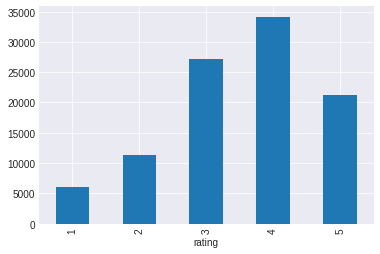

In [17]:
# Extract the ratings from the DataFrame
ratings = data.rating

# Plot histogram
data.groupby("rating").size().plot(kind="bar");

In [18]:
data.rating.describe()

count    100000.000000
mean          3.529860
std           1.125674
min           1.000000
25%           3.000000
50%           4.000000
75%           4.000000
max           5.000000
Name: rating, dtype: float64

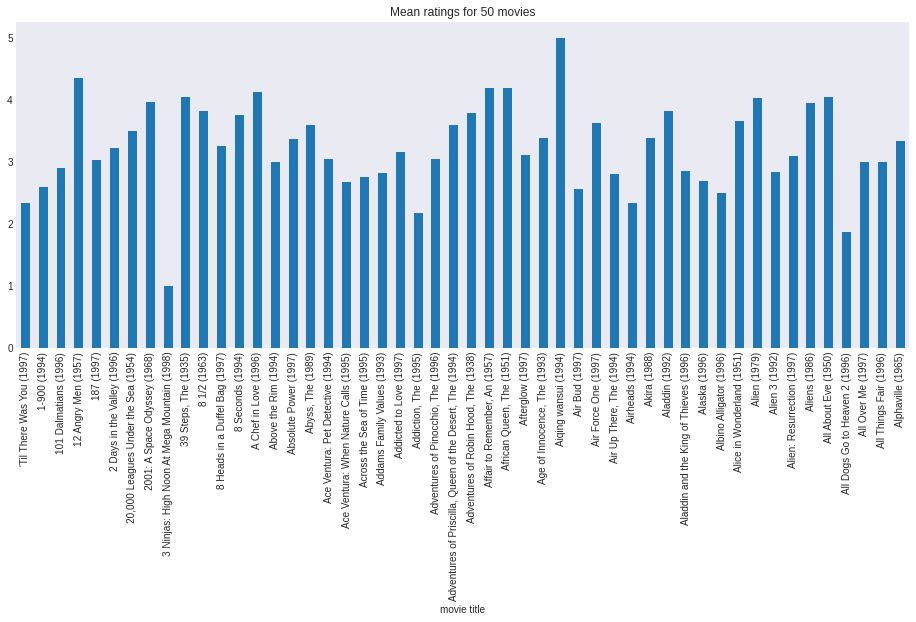

In [19]:
movie_means = data.join(movies["movie title"], on="itemid").groupby("movie title").rating.mean()
movie_means[:50].plot(kind="bar", grid=False, figsize=(16, 6), title="Mean ratings for 50 movies");


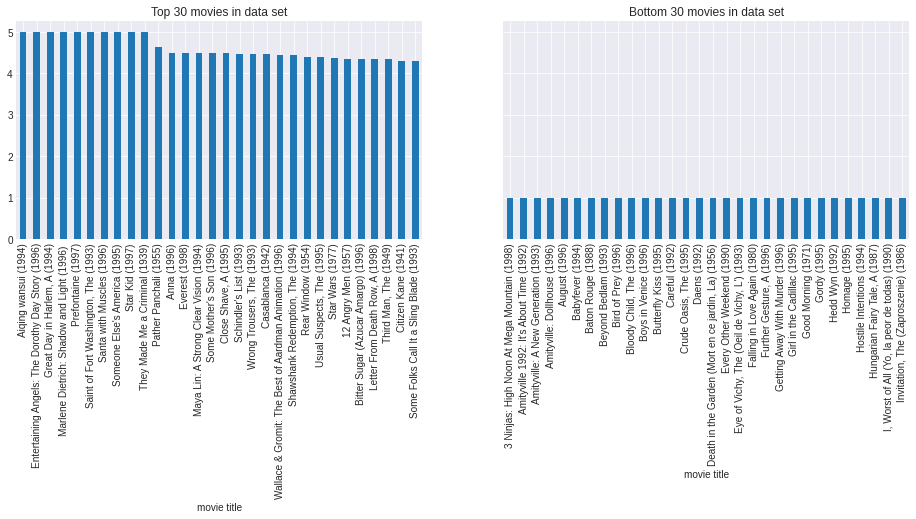

In [20]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 4), sharey=True)
movie_means.nlargest(30).plot(kind="bar", ax=ax1, title="Top 30 movies in data set")
movie_means.nsmallest(30).plot(kind="bar", ax=ax2, title="Bottom 30 movies in data set");


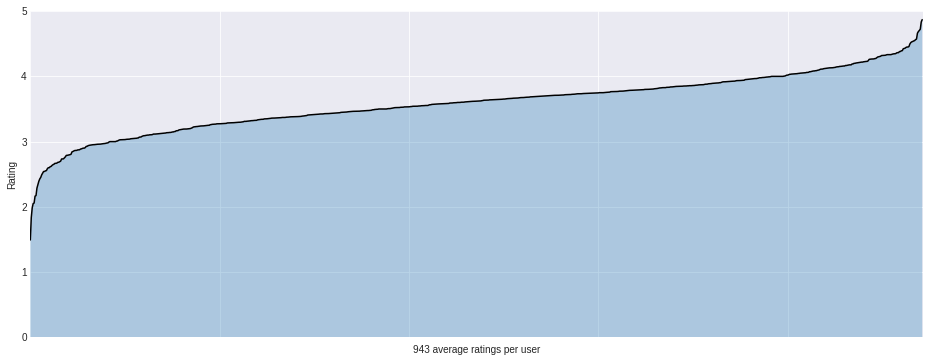

In [21]:
user_means = data.groupby("userid").rating.mean().sort_values()
_, ax = plt.subplots(figsize=(16, 6))
ax.plot(np.arange(len(user_means)), user_means.values, "k-")

ax.fill_between(np.arange(len(user_means)), user_means.values, alpha=0.3)
ax.set_xticklabels("")
# 1000 labels is nonsensical
ax.set_ylabel("Rating")
ax.set_xlabel(f"{len(user_means)} average ratings per user")
ax.set_ylim(0, 5)
ax.set_xlim(0, len(user_means));

In [22]:
# Create a base class with scaffolding for our 3 baselines.


def split_title(title):
    """Change "BaselineMethod" to "Baseline Method"."""
    words = []
    tmp = [title[0]]
    for c in title[1:]:
        if c.isupper():
            words.append("".join(tmp))
            tmp = [c]
        else:
            tmp.append(c)
    words.append("".join(tmp))
    return " ".join(words)


class Baseline:
    """Calculate baseline predictions."""

    def __init__(self, train_data):
        """Simple heuristic-based transductive learning to fill in missing
        values in data matrix."""
        self.predict(train_data.copy())

    def predict(self, train_data):
        raise NotImplementedError("baseline prediction not implemented for base class")

    def rmse(self, test_data):
        """Calculate root mean squared error for predictions on test data."""
        return rmse(test_data, self.predicted)

    def __str__(self):
        return split_title(self.__class__.__name__)


# Implement the 3 baselines.


class UniformRandomBaseline(Baseline):
    """Fill missing values with uniform random values."""

    def predict(self, train_data):
        nan_mask = np.isnan(train_data)
        masked_train = np.ma.masked_array(train_data, nan_mask)
        pmin, pmax = masked_train.min(), masked_train.max()
        N = nan_mask.sum()
        train_data[nan_mask] = np.random.uniform(pmin, pmax, N)
        self.predicted = train_data


class GlobalMeanBaseline(Baseline):
    """Fill in missing values using the global mean."""

    def predict(self, train_data):
        nan_mask = np.isnan(train_data)
        train_data[nan_mask] = train_data[~nan_mask].mean()
        self.predicted = train_data


class MeanOfMeansBaseline(Baseline):
    """Fill in missing values using mean of user/item/global means."""

    def predict(self, train_data):
        nan_mask = np.isnan(train_data)
        masked_train = np.ma.masked_array(train_data, nan_mask)
        global_mean = masked_train.mean()
        user_means = masked_train.mean(axis=1)
        item_means = masked_train.mean(axis=0)
        self.predicted = train_data.copy()
        n, m = train_data.shape
        for i in range(n):
            for j in range(m):
                if np.ma.isMA(item_means[j]):
                    self.predicted[i, j] = np.mean((global_mean, user_means[i]))
                else:
                    self.predicted[i, j] = np.mean((global_mean, user_means[i], item_means[j]))


baseline_methods = {}
baseline_methods["ur"] = UniformRandomBaseline
baseline_methods["gm"] = GlobalMeanBaseline
baseline_methods["mom"] = MeanOfMeansBaseline

In [23]:
num_users = data.userid.unique().shape[0]
num_items = data.itemid.unique().shape[0]
sparsity = 1 - len(data) / (num_users * num_items)
print(f"Users: {num_users}\nMovies: {num_items}\nSparsity: {sparsity}")

dense_data = data.pivot(index="userid", columns="itemid", values="rating").values


Users: 943
Movies: 1682
Sparsity: 0.9369533063577546


In [42]:
# Enable on-the-fly graph computations, but ignore
# absence of intermediate test values.
theano.config.compute_test_value = "ignore"

# Set up logging.
logger = logging.getLogger()
logger.setLevel(logging.INFO)


class PMF:
    """Probabilistic Matrix Factorization model using pymc3."""

    def __init__(self, train, dim, alpha=2, std=0.01, bounds=(1, 5)):
        """Build the Probabilistic Matrix Factorization model using pymc3.

        :param np.ndarray train: The training data to use for learning the model.
        :param int dim: Dimensionality of the model; number of latent factors.
        :param int alpha: Fixed precision for the likelihood function.
        :param float std: Amount of noise to use for model initialization.
        :param (tuple of int) bounds: (lower, upper) bound of ratings.
            These bounds will simply be used to cap the estimates produced for R.

        """
        self.dim = dim
        self.alpha = alpha
        self.std = np.sqrt(1.0 / alpha)
        self.bounds = bounds
        self.data = train.copy()
        n, m = self.data.shape

        # Perform mean value imputation
        nan_mask = np.isnan(self.data)
        self.data[nan_mask] = self.data[~nan_mask].mean()

        # Low precision reflects uncertainty; prevents overfitting.
        # Set to the mean variance across users and items.
        self.alpha_u = 1 / self.data.var(axis=1).mean()
        self.alpha_v = 1 / self.data.var(axis=0).mean()

        # Specify the model.
        logging.info("building the PMF model")
        with pm.Model() as pmf:
            U = pm.MvNormal(
                "U",
                mu=0,
                tau=self.alpha_u * np.eye(dim),
                shape=(n, dim),
                testval=np.random.randn(n, dim) * std,
            )
            V = pm.MvNormal(
                "V",
                mu=0,
                tau=self.alpha_v * np.eye(dim),
                shape=(m, dim),
                testval=np.random.randn(m, dim) * std,
            )
            R = pm.Normal(
                "R", mu=(U @ V.T)[~nan_mask], tau=self.alpha, observed=self.data[~nan_mask]
            )

        logging.info("done building the PMF model")
        self.model = pmf

    def __str__(self):
        return self.name
    
    def find_map(self):
        """Find mode of posterior using L-BFGS-B optimization."""
        tstart = time.time()
        with self.model:
            logging.info("finding PMF MAP using L-BFGS-B optimization...")
            self._map = pm.find_MAP(method="L-BFGS-B")

        elapsed = int(time.time() - tstart)
        logging.info("found PMF MAP in %d seconds" % elapsed)
        return self._map


    @property
    def map(self):
        try:
            return self._map
        except:
            return self.find_map()
    
    # Draw MCMC samples.
    def draw_samples(self, **kwargs):
        kwargs.setdefault("chains", 1)
        with self.model:
            self.trace = pm.sample(**kwargs)


    # Update our class with the sampling infrastructure.
    
    def predict(self, U, V):
        """Estimate R from the given values of U and V."""
        R = np.dot(U, V.T)
        n, m = R.shape
        sample_R = np.random.normal(R, self.std)
        # bound ratings
        low, high = self.bounds
        sample_R[sample_R < low] = low
        sample_R[sample_R > high] = high
        return sample_R

    
    def eval_map(pmf_model, train, test):
        U = pmf_model.map["U"]
        V = pmf_model.map["V"]

        # Make predictions and calculate RMSE on train & test sets.
        predictions = pmf_model.predict(U, V)
        train_rmse = rmse(train, predictions)
        test_rmse = rmse(test, predictions)
        overfit = test_rmse - train_rmse

        # Print report.
        print("PMF MAP training RMSE: %.5f" % train_rmse)
        print("PMF MAP testing RMSE:  %.5f" % test_rmse)
        print("Train/test difference: %.5f" % overfit)

        return test_rmse
    
    def norms(pmf_model, monitor=("U", "V"), ord="fro"):
        """Return norms of latent variables at each step in the
        sample trace. These can be used to monitor convergence
        of the sampler.
        """
        monitor = ("U", "V")
        norms = {var: [] for var in monitor}
        for sample in pmf_model.trace:
            for var in monitor:
                norms[var].append(np.linalg.norm(sample[var], ord))
        return norms


    def traceplot(pmf_model):
        """Plot Frobenius norms of U and V as a function of sample #."""
        trace_norms = pmf_model.norms()
        u_series = pd.Series(trace_norms["U"])
        v_series = pd.Series(trace_norms["V"])
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 7))
        u_series.plot(kind="line", ax=ax1, grid=False, title=r"$\|U\|_{Fro}^2$ at Each Sample")
        v_series.plot(kind="line", ax=ax2, grid=False, title=r"$\|V\|_{Fro}^2$ at Each Sample")
        ax1.set_xlabel("Sample Number")
        ax2.set_xlabel("Sample Number")
    
    def running_rmse(pmf_model, test_data, train_data, burn_in=0, plot=True):
        """Calculate RMSE for each step of the trace to monitor convergence."""
        burn_in = burn_in if len(pmf_model.trace) >= burn_in else 0
        results = {"per-step-train": [], "running-train": [], "per-step-test": [], "running-test": []}
        R = np.zeros(test_data.shape)
        for cnt, sample in enumerate(pmf_model.trace[burn_in:]):
            sample_R = pmf_model.predict(sample["U"], sample["V"])
            R += sample_R
            running_R = R / (cnt + 1)
            results["per-step-train"].append(rmse(train_data, sample_R))
            results["running-train"].append(rmse(train_data, running_R))
            results["per-step-test"].append(rmse(test_data, sample_R))
            results["running-test"].append(rmse(test_data, running_R))

        results = pd.DataFrame(results)

        if plot:
            results.plot(
                kind="line",
                grid=False,
                figsize=(15, 7),
                title="Per-step and Running RMSE From Posterior Predictive",
            )

        # Return the final predictions, and the RMSE calculations
        return running_R, results

In [43]:
# Define our evaluation function.
def rmse(test_data, predicted):
    """Calculate root mean squared error.
    Ignoring missing values in the test data.
    """
    I = ~np.isnan(test_data)  # indicator for missing values
    N = I.sum()  # number of non-missing values
    sqerror = abs(test_data - predicted) ** 2  # squared error array
    mse = sqerror[I].sum() / N  # mean squared error
    return np.sqrt(mse)  # RMSE

In [44]:
# Define a function for splitting train/test data.
def split_train_test(data, percent_test=0.1):
    """Split the data into train/test sets.
    :param int percent_test: Percentage of data to use for testing. Default 10.
    """
    n, m = data.shape  # # users, # movies
    N = n * m  # # cells in matrix

    # Prepare train/test ndarrays.
    train = data.copy()
    test = np.ones(data.shape) * np.nan

    # Draw random sample of training data to use for testing.
    tosample = np.where(~np.isnan(train))  # ignore nan values in data
    idx_pairs = list(zip(tosample[0], tosample[1]))  # tuples of row/col index pairs

    test_size = int(len(idx_pairs) * percent_test)  # use 10% of data as test set
    train_size = len(idx_pairs) - test_size  # and remainder for training

    indices = np.arange(len(idx_pairs))  # indices of index pairs
    sample = np.random.choice(indices, replace=False, size=test_size)

    # Transfer random sample from train set to test set.
    for idx in sample:
        idx_pair = idx_pairs[idx]
        test[idx_pair] = train[idx_pair]  # transfer to test set
        train[idx_pair] = np.nan  # remove from train set

    # Verify everything worked properly
    assert train_size == N - np.isnan(train).sum()
    assert test_size == N - np.isnan(test).sum()

    # Return train set and test set
    return train, test


train, test = split_train_test(dense_data)

In [45]:
# Let's see the results:
baselines = {}
for name in baseline_methods:
    Method = baseline_methods[name]
    method = Method(train)
    baselines[name] = method.rmse(test)
    print("{} RMSE:\t{:.5f}".format(method, baselines[name]))


Uniform Random Baseline RMSE:	1.71595
Global Mean Baseline RMSE:	1.13404
Mean Of Means Baseline RMSE:	1.02781


### Probabilistic Matrix Factorization (PMF)

In [46]:
# We use a fixed precision for the likelihood.
# This reflects uncertainty in the dot product.
# We choose 2 in the footsteps Salakhutdinov
# Mnihof.
ALPHA = 2

# The dimensionality D; the number of latent factors.
# We can adjust this higher to try to capture more subtle
# characteristics of each movie. However, the higher it is,
# the more expensive our inference procedures will be.
# Specifically, we have D(N + M) latent variables. For our
# Movielens dataset, this means we have D(2625), so for 5
# dimensions, we are sampling 13125 latent variables.
DIM = 10


pmf = PMF(train, DIM, ALPHA, std=0.05)


INFO:root:building the PMF model
INFO:filelock:Lock 139784163103024 acquired on /home/davi/.theano/compiledir_Linux-5.4--generic-x86_64-with-glibc2.29-x86_64-3.8.10-64/.lock
INFO:filelock:Lock 139784163103024 released on /home/davi/.theano/compiledir_Linux-5.4--generic-x86_64-with-glibc2.29-x86_64-3.8.10-64/.lock
INFO:filelock:Lock 139784237393712 acquired on /home/davi/.theano/compiledir_Linux-5.4--generic-x86_64-with-glibc2.29-x86_64-3.8.10-64/.lock
INFO:filelock:Lock 139784237393712 released on /home/davi/.theano/compiledir_Linux-5.4--generic-x86_64-with-glibc2.29-x86_64-3.8.10-64/.lock
INFO:filelock:Lock 139784232713904 acquired on /home/davi/.theano/compiledir_Linux-5.4--generic-x86_64-with-glibc2.29-x86_64-3.8.10-64/.lock
INFO:filelock:Lock 139784232713904 released on /home/davi/.theano/compiledir_Linux-5.4--generic-x86_64-with-glibc2.29-x86_64-3.8.10-64/.lock
INFO:filelock:Lock 139784236462816 acquired on /home/davi/.theano/compiledir_Linux-5.4--generic-x86_64-with-glibc2.29-x86

In [47]:
pmf.find_map()

INFO:root:finding PMF MAP using L-BFGS-B optimization...
INFO:filelock:Lock 139783743594112 acquired on /home/davi/.theano/compiledir_Linux-5.4--generic-x86_64-with-glibc2.29-x86_64-3.8.10-64/.lock
INFO:filelock:Lock 139783743594112 released on /home/davi/.theano/compiledir_Linux-5.4--generic-x86_64-with-glibc2.29-x86_64-3.8.10-64/.lock
INFO:filelock:Lock 139783743410864 acquired on /home/davi/.theano/compiledir_Linux-5.4--generic-x86_64-with-glibc2.29-x86_64-3.8.10-64/.lock
INFO:filelock:Lock 139783743410864 released on /home/davi/.theano/compiledir_Linux-5.4--generic-x86_64-with-glibc2.29-x86_64-3.8.10-64/.lock
INFO:filelock:Lock 139783743591232 acquired on /home/davi/.theano/compiledir_Linux-5.4--generic-x86_64-with-glibc2.29-x86_64-3.8.10-64/.lock
INFO:filelock:Lock 139783743591232 released on /home/davi/.theano/compiledir_Linux-5.4--generic-x86_64-with-glibc2.29-x86_64-3.8.10-64/.lock
INFO:filelock:Lock 139783744034128 acquired on /home/davi/.theano/compiledir_Linux-5.4--generic-x

INFO:root:found PMF MAP in 87 seconds


{'U': array([[ 0.3428349 ,  0.37879491, -1.07689365, ...,  0.1661486 ,
          0.75593434,  0.83196883],
        [ 0.2131522 ,  0.17203598, -1.19276841, ..., -0.39167035,
          0.05226502,  0.54093877],
        [ 0.61689974,  0.54070115, -0.79613811, ..., -0.49894593,
          0.14346041,  0.13605425],
        ...,
        [ 0.69738405,  0.2157341 , -0.87517982, ..., -0.59148133,
          0.29985755,  0.60078713],
        [ 0.43633268,  0.85409879, -1.01061226, ..., -0.6085303 ,
         -0.05503205,  0.97552299],
        [ 1.39112408, -0.16101796, -1.6726068 , ..., -0.72707109,
         -0.00391467,  0.24518731]]),
 'V': array([[ 0.44250482,  0.47900023, -0.97887873, ..., -1.18007202,
          0.53383051,  0.56308605],
        [ 0.50938017,  0.62267618, -0.6526037 , ..., -0.562585  ,
         -0.22345331,  0.56775501],
        [ 0.89316041,  0.52830011, -1.09992898, ...,  0.05576089,
          0.42704521,  0.36755906],
        ...,
        [ 0.11134519, -0.0811508 , -0.248454

In [48]:
# Evaluate PMF MAP estimates.
pmf_map_rmse = pmf.eval_map(train, test)
pmf_improvement = baselines["mom"] - pmf_map_rmse
print("PMF MAP Improvement:   %.5f" % pmf_improvement)

PMF MAP training RMSE: 1.01451
PMF MAP testing RMSE:  1.16301
Train/test difference: 0.14850
PMF MAP Improvement:   -0.13520


In [49]:
pmf.draw_samples(
    draws=500,
    tune=500,
)

/tmp/ipykernel_254355/3717871550.py:96: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  self.trace = pm.sample(**kwargs)
Auto-assigning NUTS sampler...
INFO:pymc3:Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
INFO:pymc3:Initializing NUTS using jitter+adapt_diag...
INFO:filelock:Lock 139785093982864 acquired on /home/davi/.theano/compiledir_Linux-5.4--generic-x86_64-with-glibc2.29-x86_64-3.8.10-64/.lock
INFO:filelock:Lock 139785093982864 released on /home/davi/.theano/compiledir_Linux-5.4--generic-x86_64-with-glibc2.29-x86_64-3.8.10-64/.lock
INFO:filelock:Lock 139785094038720 acquired on /home/davi/.theano/compiledir_Linux-5.4--generic-x86_64-with-glibc2.29-x86_64-3.8.10-64/.lock
INFO:filelock:Lock 139785094038720 released on /home/davi/.theano/compiledir_Linux-5.4--generic-x86_64-wit

Sampling 1 chain for 500 tune and 500 draw iterations (500 + 500 draws total) took 7478 seconds.
INFO:pymc3:Sampling 1 chain for 500 tune and 500 draw iterations (500 + 500 draws total) took 7478 seconds.
INFO:filelock:Lock 139783744826288 acquired on /home/davi/.theano/compiledir_Linux-5.4--generic-x86_64-with-glibc2.29-x86_64-3.8.10-64/.lock
INFO:filelock:Lock 139783744826288 released on /home/davi/.theano/compiledir_Linux-5.4--generic-x86_64-with-glibc2.29-x86_64-3.8.10-64/.lock
Only one chain was sampled, this makes it impossible to run some convergence checks
INFO:pymc3:Only one chain was sampled, this makes it impossible to run some convergence checks


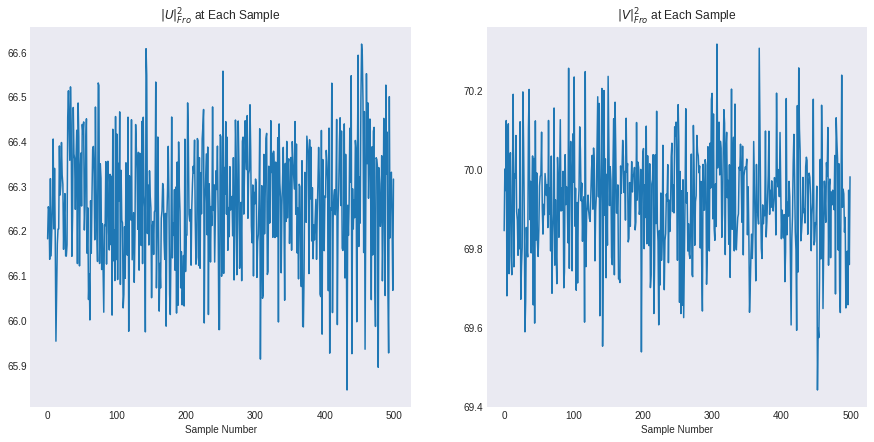

In [50]:
pmf.traceplot()

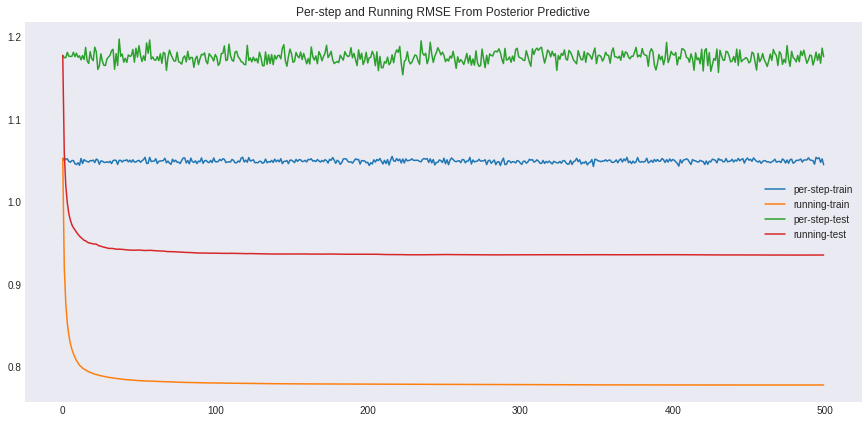

In [51]:
predicted, results = pmf.running_rmse(test, train)

In [52]:
# And our final RMSE?
final_test_rmse = results["running-test"].values[-1]
final_train_rmse = results["running-train"].values[-1]
print("Posterior predictive train RMSE: %.5f" % final_train_rmse)
print("Posterior predictive test RMSE:  %.5f" % final_test_rmse)
print("Train/test difference:           %.5f" % (final_test_rmse - final_train_rmse))
print("Improvement from MAP:            %.5f" % (pmf_map_rmse - final_test_rmse))
print("Improvement from Mean of Means:  %.5f" % (baselines["mom"] - final_test_rmse))

Posterior predictive train RMSE: 0.77811
Posterior predictive test RMSE:  0.93558
Train/test difference:           0.15747
Improvement from MAP:            0.22743
Improvement from Mean of Means:  0.09223


Text(0, 0.5, 'RMSE')

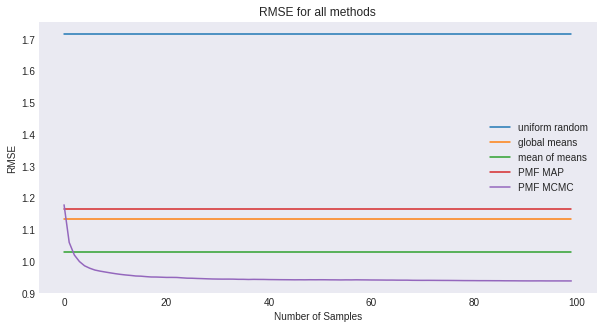

In [53]:
size = 100  # RMSE doesn't really change after 100th sample anyway.
all_results = pd.DataFrame(
    {
        "uniform random": np.repeat(baselines["ur"], size),
        "global means": np.repeat(baselines["gm"], size),
        "mean of means": np.repeat(baselines["mom"], size),
        "PMF MAP": np.repeat(pmf_map_rmse, size),
        "PMF MCMC": results["running-test"][:size],
    }
)
fig, ax = plt.subplots(figsize=(10, 5))
all_results.plot(kind="line", grid=False, ax=ax, title="RMSE for all methods")
ax.set_xlabel("Number of Samples")
ax.set_ylabel("RMSE")

In [115]:
%load_ext watermark
%watermark -n -u -v -iv -w

Last updated: Wed Aug 25 2021

Python implementation: CPython
Python version       : 3.8.10
IPython version      : 7.26.0

seaborn   : 0.11.2
networkx  : 2.6.2
pymc3     : 3.11.4
logging   : 0.5.1.2
spacy     : 3.1.2
scipy     : 1.7.1
sklearn   : 0.0
theano    : 1.0.5
pandas    : 1.3.2
requests  : 2.26.0
matplotlib: 3.4.3
numpy     : 1.21.2

Watermark: 2.2.0

